In [45]:
import cv2
import numpy as np
import torch
import torch.nn as nn
from torchvision import models
from abc import ABC, abstractmethod
from dataclasses import dataclass, field
from typing import Optional, List, Dict, Union
from pathlib import Path
from PIL import Image
from transformers import Mask2FormerForUniversalSegmentation
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from transformers import BeitForSemanticSegmentation
import cv2
from torch.utils.data import Dataset, DataLoader
from scipy import stats
import os
import json
from transformers import BeitImageProcessor
import torchvision.transforms.functional as TF
import torchvision.transforms as T


class ISegmentatorPredictor(ABC):
    @abstractmethod
    def predict(self, image: np.ndarray) -> np.ndarray:
        pass


import numpy as np
from scipy import stats
from dataclasses import dataclass, field
from typing import List, Optional, Dict, Any
import logging

logger = logging.getLogger(__name__)


class AutoMarkuper:
    @dataclass
    class AutoMarkupResult:
        mask: Optional[np.ndarray]  # Итоговая маска (None если не уверены)
        needs_manual_review: bool  # True = отправить на ручную разметку
        consensus_mask: Optional[
            np.ndarray
        ] = None  # Маска большинства (даже при rejected)
        metrics: Dict[str, Any] = field(default_factory=dict)  # Метрики согласованности

        @property
        def is_auto_labeled(self) -> bool:
            return not self.needs_manual_review and self.mask is not None

    def __init__(
        self,
        segmentators: List["ISegmentatorPredictor"],
        num_classes: int,
        ignore_index: int = 255,
        min_pairwise_miou: float = 0.7,
        min_per_class_iou: float = 0.5,
        min_full_consensus_ratio: float = 0.6,
        min_majority_ratio: float = 0.85,
    ):
        if len(segmentators) < 2:
            raise ValueError("Нужно минимум 2 сегментатора для consensus")

        if len(segmentators) == 2:
            logger.warning(
                "С 2 моделями majority_vote эквивалентно full_consensus. "
                "Рекомендуется использовать 3+ моделей для лучшей оценки согласия."
            )

        self.segmentators = segmentators
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.min_pairwise_miou = min_pairwise_miou
        self.min_per_class_iou = min_per_class_iou
        self.min_full_consensus_ratio = min_full_consensus_ratio
        self.min_majority_ratio = min_majority_ratio

    def automarkup(self, image: np.ndarray) -> AutoMarkupResult:
        # === Шаг 1: Получаем предсказания от всех моделей ===
        predictions = []
        for seg in self.segmentators:
            result = seg.predict(image)
            predictions.append(result)

        masks = np.stack(predictions, axis=0)  # [K, H, W]

        # === Шаг 2: Вычисляем метрики согласованности ===
        metrics = self._compute_agreement_metrics(masks)

        # === Шаг 3: Строим majority vote маску ===
        majority_mask = self._majority_vote(masks)

        # === Шаг 4: Принимаем решение ===
        is_good = self._is_quality_sufficient(metrics)

        if is_good:
            # Успех: возвращаем маску, где только согласованные пиксели
            final_mask = self._build_pseudo_label(masks, majority_mask, metrics)

            return self.AutoMarkupResult(
                mask=final_mask,
                needs_manual_review=False,
                consensus_mask=majority_mask,
                metrics=metrics,
            )
        else:
            # Отправляем на ручную разметку
            # majority_mask сохраняем — пригодится для предзаполнения
            return self.AutoMarkupResult(
                mask=None,
                needs_manual_review=True,
                consensus_mask=majority_mask,
                metrics=metrics,
            )

    def batch_automarkup(self, images: List[np.ndarray]) -> List[AutoMarkupResult]:
        """Пакетная обработка изображений.

        Args:
            images: список изображений

        Returns:
            Список результатов AutoMarkupResult
        """
        results = []
        for i, img in enumerate(images):
            logger.info(f"Обработка изображения {i+1}/{len(images)}")
            result = self.automarkup(img)
            results.append(result)
        return results

    def _compute_agreement_metrics(self, masks: np.ndarray) -> dict:
        K = masks.shape[0]
        total_pixels = masks.shape[1] * masks.shape[2]

        # Порог значимости класса: класс должен занимать хотя бы 0.1% изображения
        MIN_CLASS_AREA = 0.001

        pairwise_ious = []
        per_class_iou_lists = [[] for _ in range(self.num_classes)]

        # Сначала вычисляем площади классов (по всем маскам)
        class_areas = np.zeros(self.num_classes)
        for cls in range(self.num_classes):
            # Класс считается присутствующим, если есть хотя бы в одной маске
            cls_present = np.any(masks == cls, axis=0)
            class_areas[cls] = cls_present.sum() / total_pixels

        for i in range(K):
            for j in range(i + 1, K):
                ious = self._compute_iou(masks[i], masks[j])

                # Собираем IoU только для значимых классов
                significant_ious = []
                for cls in range(self.num_classes):
                    if not np.isnan(ious[cls]) and class_areas[cls] >= MIN_CLASS_AREA:
                        significant_ious.append(ious[cls])

                # Если есть значимые классы — считаем среднее по ним
                if significant_ious:
                    pairwise_ious.append(np.mean(significant_ious))
                # Если значимых классов нет, но есть хоть какие-то классы — берём всё
                elif not np.all(np.isnan(ious)):
                    pairwise_ious.append(np.nanmean(ious))

                # Для per_class_iou собираем все данные (включая незначимые)
                for cls in range(self.num_classes):
                    if not np.isnan(ious[cls]):
                        per_class_iou_lists[cls].append(ious[cls])

        per_class_iou = np.full(self.num_classes, np.nan)
        for cls in range(self.num_classes):
            if per_class_iou_lists[cls]:
                per_class_iou[cls] = np.mean(per_class_iou_lists[cls])

        mean_pairwise_miou = np.mean(pairwise_ious) if pairwise_ious else 0.0

        full_consensus = np.all(masks == masks[0:1], axis=0)
        full_consensus_ratio = full_consensus.mean()

        majority_mask, counts = stats.mode(masks, axis=0, keepdims=False)
        majority_mask = majority_mask.squeeze()
        counts = counts.squeeze()

        majority_threshold = K // 2 + 1
        majority_agreement = counts >= majority_threshold
        majority_ratio = majority_agreement.mean()

        consensus_classes = set()
        per_class_full_consensus = {}
        per_class_area_ratio = {}

        for cls in range(self.num_classes):
            cls_in_majority = (majority_mask == cls).any()
            cls_in_any_mask = any((mask == cls).any() for mask in masks)

            if cls_in_majority or cls_in_any_mask:
                consensus_classes.add(cls)

                cls_pixels = majority_mask == cls
                if cls_pixels.any():
                    cls_full_agree = (
                        full_consensus & cls_pixels
                    ).sum() / cls_pixels.sum()
                    per_class_full_consensus[cls] = float(cls_full_agree)
                    per_class_area_ratio[cls] = float(cls_pixels.sum() / total_pixels)
                else:
                    cls_pixels_any = np.any(masks == cls, axis=0)
                    if cls_pixels_any.any():
                        cls_full_agree = (
                            full_consensus & cls_pixels_any
                        ).sum() / cls_pixels_any.sum()
                        per_class_full_consensus[cls] = float(cls_full_agree)
                        per_class_area_ratio[cls] = float(
                            cls_pixels_any.sum() / total_pixels
                        )
                    else:
                        per_class_full_consensus[cls] = 0.0
                        per_class_area_ratio[cls] = 0.0

        return {
            "pairwise_ious": [float(x) for x in pairwise_ious],
            "mean_pairwise_miou": float(mean_pairwise_miou),
            "per_class_iou": per_class_iou.tolist(),
            "full_consensus_ratio": float(full_consensus_ratio),
            "majority_ratio": float(majority_ratio),
            "per_class_full_consensus": per_class_full_consensus,
            "per_class_area_ratio": per_class_area_ratio,
            "consensus_classes": list(consensus_classes),
            "num_models": K,
        }

    def _compute_iou(self, mask1: np.ndarray, mask2: np.ndarray) -> np.ndarray:
        ious = np.full(self.num_classes, np.nan)

        for cls in range(self.num_classes):
            m1 = mask1 == cls
            m2 = mask2 == cls

            intersection = (m1 & m2).sum()
            union = (m1 | m2).sum()

            if union > 0:
                ious[cls] = intersection / union

        return ious

    def _majority_vote(self, masks: np.ndarray) -> np.ndarray:
        majority, _ = stats.mode(masks, axis=0, keepdims=False)
        return majority.squeeze()

    def _is_quality_sufficient(self, metrics: dict) -> bool:
        checks = {}

        checks["mean_pairwise_miou"] = (
            metrics["mean_pairwise_miou"] >= self.min_pairwise_miou
        )

        per_class_ious = np.array(metrics["per_class_iou"])
        per_class_area_ratio = metrics.get("per_class_area_ratio", {})

        # Главное изменение: порог 1% вместо 10%
        # Классы с меньшей площадью не участвуют в проверке per_class_iou
        MIN_CLASS_AREA_FOR_IOU_CHECK = 0.01  # 1% от изображения

        # Определяем значимые классы (площадь >= 1% и IoU не NaN)
        significant_classes = []
        for cls_id, area in per_class_area_ratio.items():
            cls_iou = per_class_ious[cls_id]
            if area >= MIN_CLASS_AREA_FOR_IOU_CHECK and not np.isnan(cls_iou):
                significant_classes.append(cls_id)

        # Проверяем, что у всех значимых классов IoU выше порога
        if significant_classes:
            significant_ious = per_class_ious[significant_classes]
            checks["min_per_class_iou"] = (
                np.min(significant_ious) >= self.min_per_class_iou
            )
        else:
            # Если значимых классов нет вообще — проверка пройдена
            checks["min_per_class_iou"] = True

        checks["full_consensus_ratio"] = (
            metrics["full_consensus_ratio"] >= self.min_full_consensus_ratio
        )

        checks["majority_ratio"] = metrics["majority_ratio"] >= self.min_majority_ratio

        # Детальное логирование при провале
        failed_checks = [k for k, v in checks.items() if not v]
        if failed_checks:
            logger.info(f"Проверки не пройдены: {failed_checks}")

            log_parts = []
            for check_name in failed_checks:
                if check_name == "min_per_class_iou":
                    if significant_classes:
                        significant_ious = per_class_ious[significant_classes]
                        actual_value = np.min(significant_ious)
                        log_parts.append(
                            f"min_per_class_iou={actual_value:.3f} "
                            f"(порог={self.min_per_class_iou:.3f}, "
                            f"значимых классов: {len(significant_classes)} — "
                            f"классы {significant_classes} с площадью ≥{MIN_CLASS_AREA_FOR_IOU_CHECK:.1%})"
                        )
                    else:
                        log_parts.append(
                            f"min_per_class_iou: нет значимых классов "
                            f"(все классы имеют площадь <{MIN_CLASS_AREA_FOR_IOU_CHECK:.1%})"
                        )
                elif check_name == "mean_pairwise_miou":
                    log_parts.append(
                        f"mean_pairwise_miou={metrics['mean_pairwise_miou']:.3f} "
                        f"(порог={self.min_pairwise_miou:.3f})"
                    )
                elif check_name == "full_consensus_ratio":
                    log_parts.append(
                        f"full_consensus_ratio={metrics['full_consensus_ratio']:.3f} "
                        f"(порог={self.min_full_consensus_ratio:.3f})"
                    )
                elif check_name == "majority_ratio":
                    log_parts.append(
                        f"majority_ratio={metrics['majority_ratio']:.3f} "
                        f"(порог={self.min_majority_ratio:.3f})"
                    )

            logger.info(f"Текущие значения: {', '.join(log_parts)}")

        return all(checks.values())

    def _build_pseudo_label(
        self, masks: np.ndarray, majority_mask: np.ndarray, metrics: dict
    ) -> np.ndarray:
        """Строит итоговую псевдо-разметку на основе консенсуса.

        Правила:
        1. Пиксели без полного консенсуса → ignore_index
        2. Классы с низким попарным IoU → ignore_index (только для пикселей без полного консенсуса)

        Args:
            masks: [K, H, W] стэк масок
            majority_mask: [H, W] маска большинства
            metrics: метрики согласованности

        Returns:
            [H, W] итоговая маска с надежными пикселями
        """
        # Начинаем с majority vote
        pseudo = majority_mask.copy()

        # Вычисляем пиксели с полным консенсусом
        full_consensus = np.all(masks == masks[0:1], axis=0)

        # Правило 1: помечаем пиксели без полного консенсуса
        pseudo[~full_consensus] = self.ignore_index

        # Правило 2: помечаем целые классы с низким согласием
        # Но только те пиксели, которые не имеют полного консенсуса
        for cls in range(self.num_classes):
            cls_iou = metrics["per_class_iou"][cls]
            # Проверяем, что значение не NaN и ниже порога
            if not np.isnan(cls_iou) and cls_iou < self.min_per_class_iou:
                # Помечаем как ignore только пиксели без полного консенсуса
                mask_to_ignore = (pseudo == cls) & (~full_consensus)
                pseudo[mask_to_ignore] = self.ignore_index

        return pseudo


class BEiT3Wrapper(nn.Module):
    def __init__(self, model_name, num_classes, pretrained=True):
        super().__init__()

        # BEiT ожидает изображения 224x224 с патчами 16x16
        self.expected_size = 224
        self.patch_size = 16

        if pretrained:
            self.model = BeitForSemanticSegmentation.from_pretrained(
                model_name,
                num_labels=num_classes,
                ignore_mismatched_sizes=True,
                out_indices=[3, 5, 7, 11],  # Обязательно 4 индекса!
                image_size=self.expected_size,
                patch_size=self.patch_size,
            )
        else:
            from transformers import BeitConfig

            config = BeitConfig.from_pretrained(model_name)
            config.num_labels = num_classes
            config.out_indices = [3, 5, 7, 11]  # Обязательно 4 индекса!
            config.image_size = self.expected_size
            config.patch_size = self.patch_size
            self.model = BeitForSemanticSegmentation(config)

        self.classifier = nn.Identity()

    def forward(self, x):
        original_size = x.shape[-2:]

        # Масштабируем вход до 224x224
        x_resized = nn.functional.interpolate(
            x,
            size=(self.expected_size, self.expected_size),
            mode="bilinear",
            align_corners=False,
        )

        # Пропускаем через модель
        outputs = self.model(pixel_values=x_resized)
        logits = outputs.logits

        # Масштабируем выход обратно до оригинального размера
        logits = nn.functional.interpolate(
            logits, size=original_size, mode="bilinear", align_corners=False
        )

        return {"out": logits}


class BeitPredictor(ISegmentatorPredictor):
    def __init__(
        self,
        model_path: str,
        model_name: str = "microsoft/beit-base-patch16-224-pt22k-ft22k",
        num_classes: int = 11,
        image_size: tuple = (512, 512),
        device: str = None,
    ):
        self.num_classes = num_classes
        self.image_size = image_size
        self.device = (
            device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        )

        # Загружаем модель
        self.model = self._load_model(model_path, model_name, num_classes)
        self.model.to(self.device)
        self.model.eval()

        # Загружаем image processor для предобработки
        self.processor = BeitImageProcessor.from_pretrained(model_name)

    def predict(self, image: np.ndarray) -> np.ndarray:
        # Сохраняем исходный размер
        original_size = image.shape[:2]

        # Предобработка
        # Можно выбрать метод:
        # input_tensor = self._preprocess_with_processor(image)  # HuggingFace processor
        input_tensor = self._preprocess(image)  # Ручная предобработка

        # Инференс
        with torch.no_grad():
            output = self.model(input_tensor)

        # Постобработка
        mask = self._postprocess(output, original_size)

        return mask

    def predict_proba(self, image: np.ndarray) -> np.ndarray:
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            output = self.model(input_tensor)

        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        # Применяем softmax для получения вероятностей
        probabilities = torch.softmax(logits, dim=1)[0]  # (num_classes, H, W)

        # Изменяем размер до исходного
        if probabilities.shape[-2:] != original_size:
            probabilities = nn.functional.interpolate(
                probabilities.unsqueeze(0),
                size=original_size,
                mode="bilinear",
                align_corners=False,
            )[0]

        return probabilities.cpu().numpy()

    def _load_model(
        self, model_path: str, model_name: str, num_classes: int
    ) -> nn.Module:
        model = BEiT3Wrapper(
            model_name=model_name,
            num_classes=num_classes,
            pretrained=False,
        )

        checkpoint = torch.load(model_path, map_location=self.device)

        # Определяем state_dict
        if isinstance(checkpoint, dict):
            if "model_state_dict" in checkpoint:
                state_dict = checkpoint["model_state_dict"]
            elif "state_dict" in checkpoint:
                state_dict = checkpoint["state_dict"]
            else:
                state_dict = checkpoint
        else:
            state_dict = checkpoint

        # Убираем префиксы AveragedModel и module
        new_state_dict = {}
        for key, value in state_dict.items():
            # Убираем префикс 'module.' (если есть)
            if key.startswith("module."):
                key = key[7:]
            # Убираем префикс 'model.' - его ожидает модель
            new_state_dict[key] = value

        # Загружаем с игнорированием отсутствующих ключей
        missing_keys, unexpected_keys = model.load_state_dict(
            new_state_dict, strict=False
        )

        if missing_keys:
            print(f"⚠️ Missing keys: {missing_keys[:5]}...")
        if unexpected_keys:
            print(f"⚠️ Unexpected keys: {unexpected_keys[:5]}...")

        return model

    def _preprocess(self, image: np.ndarray) -> torch.Tensor:
        # Проверяем и конвертируем формат изображения
        if image.dtype != np.uint8:
            if image.max() <= 1.0:
                image = (image * 255).astype(np.uint8)
            else:
                image = image.astype(np.uint8)

        # Изменяем размер до заданного
        resized_image = cv2.resize(image, (self.image_size[1], self.image_size[0]))

        # Конвертируем в тензор [C, H, W] и нормализуем
        tensor = torch.from_numpy(resized_image).permute(2, 0, 1).float() / 255.0

        # ImageNet нормализация
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        tensor = (tensor - mean) / std

        # Добавляем batch dimension
        tensor = tensor.unsqueeze(0)

        return tensor.to(self.device)

    def _preprocess_with_processor(self, image: np.ndarray) -> torch.Tensor:
        # Используем встроенный процессор HuggingFace для BEiT
        inputs = self.processor(images=image, return_tensors="pt")

        # Изменяем размер до нужного
        pixel_values = inputs["pixel_values"]
        if pixel_values.shape[-2:] != self.image_size:
            pixel_values = nn.functional.interpolate(
                pixel_values, size=self.image_size, mode="bilinear", align_corners=False
            )

        return pixel_values.to(self.device)

    def _postprocess(self, output: torch.Tensor, original_size: tuple) -> np.ndarray:
        # Извлекаем логиты из выхода модели
        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        # Получаем предсказания классов
        # logits shape: (1, num_classes, H, W)
        predictions = torch.argmax(logits, dim=1)  # (1, H, W)

        # Убираем batch dimension
        mask = predictions.cpu().numpy()[0]  # (H, W)

        # Изменяем размер до исходного
        if mask.shape != original_size:
            mask = cv2.resize(
                mask.astype(np.float32),
                (original_size[1], original_size[0]),
                interpolation=cv2.INTER_NEAREST,
            )

        return mask.astype(np.int64)




class SegFormerPredictor(ISegmentatorPredictor, fom.Model):
    """
    SegFormer предиктор, совместимый с FiftyOne.
    """
    

    media_type = "image"
    
    def __init__(
        self,
        model_path: str,
        model_name: str = "nvidia/mit-b5",
        num_classes: int = 11,
        image_size: tuple = (512, 512),
        device: str = None,
    ):
        # Инициализируем родительский класс FiftyOne без ModelConfig
        fom.Model.__init__(self)
        
        # Параметры
        self.num_classes = num_classes
        self.image_size = image_size
        self.device = (
            device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        )

        # Загружаем модель
        self.model = self._load_model(model_path, model_name, num_classes)
        self.model.to(self.device)
        self.model.eval()

        # Трансформации для эмбеддингов
        self.transform = T.Compose([
            T.Resize((512, 512)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        
        # Для хранения эмбеддинга
        self._last_embedding = None
        self._hook = None
        
        # Регистрируем hook ПОСЛЕ загрузки модели
        self._register_hooks()

    # ============================================================
    # Методы, которые требует FiftyOne
    # ============================================================
    
    def predict(self, image: np.ndarray) -> np.ndarray:
        """Основной метод — возвращает маску сегментации"""
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            output = self.model(input_tensor)

        mask = self._postprocess(output, original_size)
        return mask

    def embed(self, img_or_path):
        """Извлекает эмбеддинг для compute_uniqueness"""
        # Загружаем изображение
        if isinstance(img_or_path, str):
            img = Image.open(img_or_path).convert("RGB")
        elif isinstance(img_or_path, np.ndarray):
            img = Image.fromarray(img_or_path)
        else:
            img = img_or_path
        
        # Предобработка
        input_tensor = self.transform(img).unsqueeze(0).to(self.device)
        
        # Прямой проход (hook сохранит эмбеддинг)
        with torch.no_grad():
            _ = self.model(input_tensor)
        
        # Возвращаем как numpy
        if self._last_embedding is not None:
            embedding = self._last_embedding.cpu().numpy().flatten()
        else:
            # Fallback: случайный вектор
            embedding = np.zeros(768, dtype=np.float32)
        
        return embedding
    
    def embed_all(self, imgs):
        """Пакетное извлечение эмбеддингов"""
        embeddings = []
        for img in imgs:
            emb = self.embed(img)
            embeddings.append(emb)
        return np.stack(embeddings)
    
    def has_embeddings(self):
        return True
    
    def predict_proba(self, image: np.ndarray) -> np.ndarray:
        """Возвращает вероятности для всех классов"""
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            output = self.model(input_tensor)

        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        probabilities = torch.softmax(logits, dim=1)[0]

        if probabilities.shape[-2:] != original_size:
            probabilities = nn.functional.interpolate(
                probabilities.unsqueeze(0),
                size=original_size,
                mode="bilinear",
                align_corners=False,
            )[0]

        return probabilities.cpu().numpy()
    
    def _register_hooks(self):
        """Регистрируем hook на энкодер SegFormer"""
        def hook_fn(module, input, output):
            if isinstance(output, list):
                hidden_states = output[-1]
            elif isinstance(output, dict):
                hidden_states = output.get("last_hidden_state", list(output.values())[-1])
            else:
                hidden_states = output
            
            if hasattr(hidden_states, 'dim'):
                if hidden_states.dim() == 4:
                    self._last_embedding = hidden_states.mean(dim=[2, 3])
                elif hidden_states.dim() == 3:
                    self._last_embedding = hidden_states.mean(dim=1)
                else:
                    self._last_embedding = hidden_states.flatten(1)
        
        # Пробуем зарегистрировать на энкодер
        try:
            # SegFormer внутри Wrapper
            encoder = self.model.model.segformer.encoder
            self._hook = encoder.register_forward_hook(hook_fn)
            print("✅ Hook на encoder")
        except AttributeError:
            try:
                # Fallback на всю внутреннюю модель
                self._hook = self.model.model.register_forward_hook(hook_fn)
                print("✅ Hook на model (fallback)")
            except Exception as e:
                print(f"⚠️ Hook не установлен: {e}")
    
    def _preprocess(self, image: np.ndarray) -> torch.Tensor:
        if image.dtype != np.uint8:
            if image.max() <= 1.0:
                image = (image * 255).astype(np.uint8)
            else:
                image = image.astype(np.uint8)

        resized_image = cv2.resize(image, (self.image_size[1], self.image_size[0]))
        tensor = torch.from_numpy(resized_image).permute(2, 0, 1).float() / 255.0

        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        tensor = (tensor - mean) / std

        return tensor.unsqueeze(0).to(self.device)
    
    def _postprocess(self, output, original_size: tuple) -> np.ndarray:
        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        predictions = torch.argmax(logits, dim=1)
        mask = predictions.cpu().numpy()[0]

        if mask.shape != original_size:
            mask = cv2.resize(
                mask.astype(np.float32),
                (original_size[1], original_size[0]),
                interpolation=cv2.INTER_NEAREST,
            )

        return mask.astype(np.int64)
    
    def _load_model(self, model_path, model_name, num_classes):
        model = SegFormerWrapper(
            model_name=model_name,
            num_classes=num_classes,
            pretrained=False,
        )

        checkpoint = torch.load(model_path, map_location=self.device)

        if isinstance(checkpoint, dict):
            if "model_state_dict" in checkpoint:
                state_dict = checkpoint["model_state_dict"]
            elif "state_dict" in checkpoint:
                state_dict = checkpoint["state_dict"]
            else:
                state_dict = checkpoint
        else:
            state_dict = checkpoint

        new_state_dict = {}
        for key, value in state_dict.items():
            if key.startswith("module."):
                key = key[7:]
            if not key.startswith("model."):
                key = "model." + key
            new_state_dict[key] = value

        missing_keys, unexpected_keys = model.load_state_dict(new_state_dict, strict=False)

        if missing_keys:
            print(f"⚠️ Missing keys: {len(missing_keys)}")
        if unexpected_keys:
            print(f"⚠️ Unexpected keys: {len(unexpected_keys)}")
        
        if len(missing_keys) > 100:
            print("❌ СЛИШКОМ МНОГО MISSING KEYS — веса не загружены!")
        else:
            print("✅ Веса загружены успешно")

        return model
    
    def __del__(self):
        if self._hook is not None:
            self._hook.remove()

class SegFormerWrapper(nn.Module):
    def __init__(self, model_name, num_classes, pretrained=True):
        super().__init__()
        if pretrained:
            self.model = SegformerForSemanticSegmentation.from_pretrained(
                model_name, num_labels=num_classes, ignore_mismatched_sizes=True
            )
        else:
            from transformers import SegformerConfig

            config = SegformerConfig.from_pretrained(model_name)
            config.num_labels = num_classes
            self.model = SegformerForSemanticSegmentation(config)
        self.classifier = nn.Identity()

    def forward(self, x):
        outputs = self.model(pixel_values=x)
        logits = outputs.logits
        logits = nn.functional.interpolate(
            logits, size=x.shape[-2:], mode="bilinear", align_corners=False
        )
        return {"out": logits}


class Mask2FormerPredictor(ISegmentatorPredictor):
    def __init__(
        self,
        model_path: str,
        model_name: str = "facebook/mask2former-swin-base-coco-panoptic",
        num_classes: int = 11,
        image_size: tuple = (512, 512),
        device: str = None,
    ):
        """
        Инициализация предиктора Mask2Former

        Args:
            model_path: путь к сохраненным весам модели
            model_name: название модели Mask2Former
            num_classes: количество классов сегментации
            image_size: размер входного изображения (H, W)
            device: устройство для инференса ('cuda' или 'cpu')
        """
        self.num_classes = num_classes
        self.image_size = image_size
        self.device = (
            device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        )

        # Загружаем модель
        self.model = self._load_model(model_path, model_name, num_classes)
        self.model.to(self.device)
        self.model.eval()

    def predict(self, image: np.ndarray) -> np.ndarray:
        # Сохраняем исходный размер
        original_size = image.shape[:2]

        # Предобработка
        input_tensor = self._preprocess(image)

        # Инференс
        with torch.no_grad():
            output = self.model(input_tensor)

        # Постобработка
        mask = self._postprocess(output, original_size)

        return mask

    def predict_with_confidence(
        self, image: np.ndarray, confidence_threshold: float = 0.5
    ) -> tuple:
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            output = self.model(input_tensor)

        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        # Применяем softmax для получения вероятностей
        probabilities = torch.softmax(logits, dim=1)[0]  # (num_classes, H, W)

        # Получаем максимальную вероятность и соответствующий класс
        max_probs, predictions = torch.max(probabilities, dim=0)  # (H, W)

        # Применяем порог уверенности
        predictions[
            max_probs < confidence_threshold
        ] = self.num_classes  # фон/неуверенный класс

        # Конвертируем в numpy
        mask = predictions.cpu().numpy()
        confidence = max_probs.cpu().numpy()

        # Изменяем размер до исходного
        if mask.shape != original_size:
            mask = cv2.resize(
                mask.astype(np.float32),
                (original_size[1], original_size[0]),
                interpolation=cv2.INTER_NEAREST,
            )
            confidence = cv2.resize(
                confidence,
                (original_size[1], original_size[0]),
                interpolation=cv2.INTER_LINEAR,
            )

        return mask.astype(np.int64), confidence

    def predict_proba(self, image: np.ndarray) -> np.ndarray:
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            output = self.model(input_tensor)

        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        # Применяем softmax для получения вероятностей
        probabilities = torch.softmax(logits, dim=1)[0]  # (num_classes, H, W)

        # Изменяем размер до исходного
        if probabilities.shape[-2:] != original_size:
            probabilities = nn.functional.interpolate(
                probabilities.unsqueeze(0),
                size=original_size,
                mode="bilinear",
                align_corners=False,
            )[0]

        return probabilities.cpu().numpy()

    def predict_detailed(self, image: np.ndarray) -> dict:
        original_size = image.shape[:2]
        input_tensor = self._preprocess(image)

        with torch.no_grad():
            # Получаем полный выход модели
            outputs = self.model.model(pixel_values=input_tensor)

            # Извлекаем маски и классы
            masks = outputs.masks_queries_logits  # [B, N_queries, H/4, W/4]
            classes = outputs.class_queries_logits  # [B, N_queries, num_classes+1]

        # Убираем "no object" класс
        classes = classes[:, :, :-1]  # [B, N_queries, num_classes]

        # Применяем sigmoid к маскам и softmax к классам
        masks_prob = masks.sigmoid()[0]  # [N_queries, H/4, W/4]
        classes_prob = classes.softmax(dim=-1)[0]  # [N_queries, num_classes]

        # Получаем финальную маску
        logits = torch.einsum("nij,nc->cij", masks_prob, classes_prob)

        # Ресайз до оригинального размера
        logits = nn.functional.interpolate(
            logits.unsqueeze(0),
            size=original_size,
            mode="bilinear",
            align_corners=False,
        )[0]

        # Получаем финальные предсказания
        probabilities = torch.softmax(logits, dim=0)
        max_probs, predictions = torch.max(probabilities, dim=0)

        return {
            "mask": predictions.cpu().numpy().astype(np.int64),
            "confidence": max_probs.cpu().numpy(),
            "probabilities": probabilities.cpu().numpy(),
            "queries_masks": masks_prob.cpu().numpy(),
            "queries_classes": classes_prob.cpu().numpy(),
        }

    def _load_model(
        self, model_path: str, model_name: str, num_classes: int
    ) -> nn.Module:
        """Загрузка модели Mask2Former с сохраненными весами"""
        # Создаем архитектуру модели
        model = Mask2FormerWrapper(
            model_name=model_name, num_classes=num_classes, pretrained=False
        )

        # Загружаем чекпоинт
        checkpoint = torch.load(model_path, map_location=self.device)

        # Определяем, что за чекпоинт
        if isinstance(checkpoint, dict):
            # Извлекаем state_dict
            state_dict = None

            # Проверяем разные ключи для state_dict
            for key in ["model_state_dict", "state_dict", "model", "weights"]:
                if key in checkpoint:
                    state_dict = checkpoint[key]
                    break

            if state_dict is None:
                # Возможно, сам словарь - это state_dict
                state_dict = checkpoint

            # Очищаем префиксы от SWA/EMA оберток
            cleaned_state_dict = self._clean_state_dict(state_dict)

            # Загружаем очищенный state_dict
            model.load_state_dict(cleaned_state_dict)

        elif isinstance(checkpoint, nn.Module):
            # Это целая модель
            model = checkpoint
        else:
            raise TypeError(f"Неизвестный тип чекпоинта: {type(checkpoint)}")

        return model

    def _clean_state_dict(self, state_dict: dict) -> dict:
        """
        Очищает state_dict от префиксов SWA/EMA оберток и DataParallel/DistributedDataParallel
        """
        cleaned_dict = {}

        for key, value in state_dict.items():
            # Пропускаем служебные ключи
            if key == "n_averaged":
                continue

            # Убираем префикс 'module.' (от DataParallel/DistributedDataParallel)
            if key.startswith("module."):
                key = key[7:]  # убираем 'module.'

            # Убираем дополнительные префиксы от SWA/EMA
            # SWA оборачивает модель в AveragedModel, что добавляет 'module.' префикс
            # Поэтому может быть 'module.module.model...'
            while key.startswith("module."):
                key = key[7:]

            cleaned_dict[key] = value

        return cleaned_dict

    def _preprocess(self, image: np.ndarray) -> torch.Tensor:
        # Проверяем и конвертируем формат изображения
        if image.dtype != np.uint8:
            if image.max() <= 1.0:
                image = (image * 255).astype(np.uint8)
            else:
                image = image.astype(np.uint8)

        # Изменяем размер до training size
        resized_image = cv2.resize(image, (self.image_size[1], self.image_size[0]))

        # Конвертируем в тензор [C, H, W] и нормализуем
        tensor = torch.from_numpy(resized_image).permute(2, 0, 1).float() / 255.0

        # ImageNet нормализация
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        tensor = (tensor - mean) / std

        # Добавляем batch dimension
        tensor = tensor.unsqueeze(0)

        return tensor.to(self.device)

    def _postprocess(self, output: torch.Tensor, original_size: tuple) -> np.ndarray:
        # Извлекаем логиты из выхода модели
        if isinstance(output, dict):
            logits = output["out"]
        else:
            logits = output

        # Получаем предсказания классов
        predictions = torch.argmax(logits, dim=1)  # (1, H, W)

        # Убираем batch dimension
        mask = predictions.cpu().numpy()[0]  # (H, W)

        # Изменяем размер до исходного
        if mask.shape != original_size:
            mask = cv2.resize(
                mask.astype(np.float32),
                (original_size[1], original_size[0]),
                interpolation=cv2.INTER_NEAREST,
            )

        return mask.astype(np.int64)


class Mask2FormerWrapper(nn.Module):
    def __init__(self, model_name, num_classes, pretrained=True):
        super().__init__()

        if pretrained:
            self.model = Mask2FormerForUniversalSegmentation.from_pretrained(
                model_name, num_labels=num_classes, ignore_mismatched_sizes=True
            )
        else:
            from transformers import Mask2FormerConfig

            config = Mask2FormerConfig.from_pretrained(model_name)
            config.num_labels = num_classes
            self.model = Mask2FormerForUniversalSegmentation(config)

        self.num_classes = num_classes
        self.classifier = nn.Identity()  # заглушка для совместимости

    def forward(self, x):
        # x: [B, 3, H, W]
        outputs = self.model(pixel_values=x)

        # Mask2Former возвращает query-based предсказания
        masks = outputs.masks_queries_logits  # [B, N, H/4, W/4]
        classes = outputs.class_queries_logits  # [B, N, num_classes+1]

        # Убираем "no object" класс (последний)
        classes = classes[:, :, :-1]  # [B, N, num_classes]

        # Применяем активации
        masks_sigmoid = masks.sigmoid()  # [B, N, H/4, W/4]
        classes_softmax = classes.softmax(dim=-1)  # [B, N, num_classes]

        # Комбинируем маски и классы
        logits = torch.einsum("bnij,bnc->bcij", masks_sigmoid, classes_softmax)

        # Апсемплим до исходного размера
        logits = nn.functional.interpolate(
            logits, size=x.shape[-2:], mode="bilinear", align_corners=False
        )

        return {"out": logits}


class LaRSPanopticDataset(Dataset):
    def __init__(self, root_dir, split="train", img_size=(512, 512)):
        self.split_dir = os.path.join(root_dir, split)
        self.images_dir = os.path.join(self.split_dir, "images")
        self.masks_dir = os.path.join(self.split_dir, "panoptic_masks")
        self.img_size = img_size

        list_path = os.path.join(self.split_dir, "image_list.txt")
        with open(list_path, "r") as f:
            self.files = [x.strip() for x in f.readlines()]

        ann_path = os.path.join(self.split_dir, "panoptic_annotations.json")
        with open(ann_path, "r") as f:
            self.ann = json.load(f)

        self.file_to_mask = {x["file_name"]: x["id"] for x in self.ann["images"]}
        self.cat_ids = sorted([c["id"] for c in self.ann["categories"]])
        self.id2idx = {cid: i for i, cid in enumerate(self.cat_ids)}

    def __len__(self):
        return len(self.files)

    def _find_file(self, folder, name):
        for ext in [".png", ".jpg", ".jpeg"]:
            path = os.path.join(folder, name + ext)
            if os.path.exists(path):
                return path
        raise FileNotFoundError(f"No file found for {name} in {folder}")

    def __getitem__(self, idx):
        name = self.files[idx]

        img_path = self._find_file(self.images_dir, name)
        image = Image.open(img_path).convert("RGB")
        image = TF.resize(image, self.img_size)
        image = TF.to_tensor(image)

        mask_path = self._find_file(self.masks_dir, name)
        mask = Image.open(mask_path)
        mask = TF.resize(mask, self.img_size, interpolation=Image.NEAREST)
        mask = np.array(mask)

        if mask.ndim == 3:
            mask = mask[..., 0]

        mask_idx = np.zeros_like(mask, dtype=np.int64)
        for k, v in self.id2idx.items():
            mask_idx[mask == k] = v

        mask_idx = torch.from_numpy(mask_idx)

        return image, mask_idx


class ImageQualityChecker:
    def check_all(self, image: np.ndarray) -> list:
        issues = []
        if self.detect_blur(image):
            issues.append("blur")
        if self.detect_overexposure(image):
            issues.append("overexposure")
        if self.detect_black_frame(image):
            issues.append("black_frame")
        if self.detect_excessive_noise(image):
            issues.append("noise")
        if self.detect_underexposure(image):
            issues.append("underexposure")
        if self.detect_color_cast(image):
            issues.append("color_cast")
        return issues

    def detect_blur(self, image: np.ndarray, threshold: float = 100.0) -> bool:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
        return laplacian_var < threshold

    def detect_overexposure(
        self,
        image: np.ndarray,
        saturation_thresh: int = 20,
        value_thresh: int = 240,
        ratio_thresh: float = 0.1,
    ) -> bool:
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        mask = (hsv[:, :, 1] < saturation_thresh) & (hsv[:, :, 2] > value_thresh)
        return mask.mean() > ratio_thresh

    def detect_black_frame(
        self, image: np.ndarray, mean_thresh: float = 5.0, std_thresh: float = 2.0
    ) -> bool:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        return gray.mean() < mean_thresh and gray.std() < std_thresh

    def detect_excessive_noise(
        self, image: np.ndarray, noise_thresh: float = 25.0
    ) -> bool:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # Оцениваем шум через медианное абсолютное отклонение от медианного фильтра
        denoised = cv2.medianBlur(gray, 5)
        noise_std = np.abs(gray.astype(float) - denoised.astype(float)).std()
        return noise_std > noise_thresh

    def detect_underexposure(
        self, image: np.ndarray, value_thresh: int = 30, ratio_thresh: float = 0.4
    ) -> bool:
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        mask = hsv[:, :, 2] < value_thresh
        return mask.mean() > ratio_thresh

    def detect_color_cast(
        self,
        image: np.ndarray,
        std_thresh: float = 15.0,
        mean_diff_thresh: float = 30.0,
    ) -> bool:
        # Дисбаланс между каналами RGB
        means = image.mean(axis=(0, 1))
        stds = image.std(axis=(0, 1))
        # Если по одному из каналов маленькая вариативность и среднее сильно отличается от других
        return (stds.min() < std_thresh) and (
            means.max() - means.min() > mean_diff_thresh
        )

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [ ]:
models_path = "/workspace/output/"

In [ ]:
mask2former = Mask2FormerPredictor(device=device, model_path=models_path+"Mask2Former_SwinB_improved_train_best.pth", num_classes=11, image_size=(512, 512))
segformer = SegFormerPredictor(device=device, model_path=models_path+"SegFormer_B5_improved_train2_best.pth", num_classes=11, image_size=(512, 512))
beit = BeitPredictor(device=device, model_path=models_path+"BEiT_Base_improved_train3_best.pth", image_size=(224, 224))

⚠️ Unexpected keys: ['n_averaged']...
⚠️ Unexpected keys: ['n_averaged']...


In [ ]:
automarkuper = AutoMarkuper(segmentators=[mask2former, segformer, beit], num_classes=11)

In [ ]:
import numpy as np
from pathlib import Path
from PIL import Image
import json
from tqdm import tqdm
import shutil

# Создаем структуру папок
output_base = Path('/workspace/data/automarkup_results')
success_dir = output_base / 'success'
manual_dir = output_base / 'needs_manual'

# Создаем подпапки для каждого видео
for vid_folder in Path('/workspace/data/to_automarkup').glob('vid*'):
    (success_dir / vid_folder.name / 'masks').mkdir(parents=True, exist_ok=True)
    (success_dir / vid_folder.name / 'images').mkdir(parents=True, exist_ok=True)
    (manual_dir / vid_folder.name / 'images').mkdir(parents=True, exist_ok=True)
    (manual_dir / vid_folder.name / 'masks').mkdir(parents=True, exist_ok=True)

# Счетчики для статистики
statistics = {
    'total': 0,
    'success': 0,
    'needs_manual': 0,
    'errors': 0
}

# Получаем список всех изображений
image_paths = list(Path('/workspace/data/to_automarkup').glob('vid*/*.png')) + \
              list(Path('/workspace/data/to_automarkup').glob('vid*/*.jpg')) + \
              list(Path('/workspace/data/to_automarkup').glob('vid*/*.jpeg'))

print(f"Найдено изображений: {len(image_paths)}")

# Обрабатываем все изображения
for img_path in tqdm(sorted(image_paths)):
    statistics['total'] += 1
    vid_name = img_path.parent.name  # vid1, vid2 и т.д.
    img_name = img_path.stem  # имя файла без расширения
    
    try:
        # Загружаем изображение как numpy array
        image = np.array(Image.open(img_path).convert('RGB'))
        
        # Проверяем, что image действительно numpy array
        if not isinstance(image, np.ndarray):
            print(f"Ошибка: изображение {img_path} не является numpy array, тип: {type(image)}")
            statistics['errors'] += 1
            continue
        
        # Получаем результат автомаркапа
        result = automarkuper.automarkup(image)
        
        # Проверяем результат
        print(f"Обработка {img_name}: is_auto_labeled={result.is_auto_labeled}, "
              f"needs_manual_review={result.needs_manual_review}")
        
        # Сохраняем оригинальное изображение
        if result.is_auto_labeled and result.mask is not None:
            # Успешная разметка
            img_dest = success_dir / vid_name / 'images' / f"{img_name}.png"
            mask_dest = success_dir / vid_name / 'masks' / f"{img_name}.png"
            
            # Сохраняем оригинал
            Image.open(img_path).save(img_dest)
            
            # Сохраняем маску
            mask_image = Image.fromarray(result.mask.astype(np.uint8))
            mask_image.save(mask_dest)
            
            # Сохраняем метрики если есть
            if result.metrics:
                metrics_path = success_dir / vid_name / 'masks' / f"{img_name}_metrics.json"
                with open(metrics_path, 'w') as f:
                    json.dump(result.metrics, f, indent=2, default=str)
            
            statistics['success'] += 1
            
        else:
            # Требуется ручная разметка
            img_dest = manual_dir / vid_name / 'images' / f"{img_name}.png"
            
            # Сохраняем оригинал
            Image.open(img_path).save(img_dest)
            
            # Сохраняем доступные маски
            if result.mask is not None:
                mask_dest = manual_dir / vid_name / 'masks' / f"{img_name}_uncertain.png"
                Image.fromarray(result.mask.astype(np.uint8)).save(mask_dest)
                
            if result.consensus_mask is not None:
                mask_dest = manual_dir / vid_name / 'masks' / f"{img_name}_consensus.png"
                Image.fromarray(result.consensus_mask.astype(np.uint8)).save(mask_dest)
            
            # Сохраняем информацию о причинах
            info_path = manual_dir / vid_name / 'images' / f"{img_name}_info.json"
            info = {
                'filename': img_name,
                'needs_manual_review': result.needs_manual_review,
                'mask_available': result.mask is not None,
                'consensus_available': result.consensus_mask is not None,
                'metrics': result.metrics if result.metrics else {}
            }
            with open(info_path, 'w') as f:
                json.dump(info, f, indent=2, default=str)
            
            statistics['needs_manual'] += 1
            
    except Exception as e:
        print(f"Ошибка при обработке {img_path}: {type(e).__name__}: {e}")
        import traceback
        traceback.print_exc()
        statistics['errors'] += 1

# Сохраняем общую статистику
summary = {
    'statistics': statistics,
    'success_rate': f"{statistics['success']/statistics['total']*100:.2f}%" if statistics['total'] > 0 else "0%"
}

with open(output_base / 'summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f"""
Результаты автоматической разметки:
=====================================
Всего изображений: {statistics['total']}
Успешно размечено: {statistics['success']} ({statistics['success']/statistics['total']*100:.1f}%)
Требуют ручной разметки: {statistics['needs_manual']} ({statistics['needs_manual']/statistics['total']*100:.1f}%)
Ошибок: {statistics['errors']}
=====================================
Результаты сохранены в: {output_base}
""")

Найдено изображений: 129


  1%|▌                                                                               | 1/129 [01:21<2:54:40, 81.88s/it]

Обработка frame_000000: is_auto_labeled=False, needs_manual_review=True


  2%|█▏                                                                              | 2/129 [02:45<2:55:16, 82.81s/it]

Обработка frame_000001: is_auto_labeled=False, needs_manual_review=True


  2%|█▊                                                                              | 3/129 [04:07<2:53:39, 82.70s/it]

Обработка frame_000002: is_auto_labeled=False, needs_manual_review=True


  3%|██▍                                                                             | 4/129 [05:30<2:51:57, 82.54s/it]

Обработка frame_000003: is_auto_labeled=False, needs_manual_review=True


  4%|███                                                                             | 5/129 [06:52<2:50:17, 82.40s/it]

Обработка frame_000004: is_auto_labeled=False, needs_manual_review=True


  5%|███▋                                                                            | 6/129 [08:12<2:47:31, 81.72s/it]

Обработка frame_000005: is_auto_labeled=False, needs_manual_review=True


  5%|████▎                                                                           | 7/129 [09:33<2:45:35, 81.44s/it]

Обработка frame_000006: is_auto_labeled=False, needs_manual_review=True


  6%|████▉                                                                           | 8/129 [10:53<2:43:01, 80.84s/it]

Обработка frame_000007: is_auto_labeled=False, needs_manual_review=True


  7%|█████▌                                                                          | 9/129 [12:12<2:40:48, 80.40s/it]

Обработка frame_000008: is_auto_labeled=False, needs_manual_review=True


  8%|██████                                                                         | 10/129 [13:32<2:39:00, 80.17s/it]

Обработка frame_000009: is_auto_labeled=False, needs_manual_review=True


  9%|██████▋                                                                        | 11/129 [14:52<2:37:51, 80.27s/it]

Обработка frame_000010: is_auto_labeled=False, needs_manual_review=True


  9%|███████▎                                                                       | 12/129 [16:13<2:36:55, 80.47s/it]

Обработка frame_000011: is_auto_labeled=False, needs_manual_review=True


 10%|███████▉                                                                       | 13/129 [17:36<2:36:54, 81.16s/it]

Обработка frame_000012: is_auto_labeled=False, needs_manual_review=True


 11%|████████▌                                                                      | 14/129 [18:56<2:34:52, 80.81s/it]

Обработка frame_000013: is_auto_labeled=False, needs_manual_review=True


 12%|█████████▏                                                                     | 15/129 [20:16<2:33:08, 80.60s/it]

Обработка frame_000014: is_auto_labeled=False, needs_manual_review=True


 12%|█████████▊                                                                     | 16/129 [21:38<2:32:23, 80.92s/it]

Обработка frame_000015: is_auto_labeled=False, needs_manual_review=True


 13%|██████████▍                                                                    | 17/129 [22:59<2:31:14, 81.02s/it]

Обработка frame_000016: is_auto_labeled=False, needs_manual_review=True


 14%|███████████                                                                    | 18/129 [24:21<2:30:21, 81.27s/it]

Обработка frame_000017: is_auto_labeled=False, needs_manual_review=True


 15%|███████████▋                                                                   | 19/129 [25:43<2:29:31, 81.56s/it]

Обработка frame_000018: is_auto_labeled=False, needs_manual_review=True


 16%|████████████▏                                                                  | 20/129 [27:06<2:28:47, 81.91s/it]

Обработка frame_000019: is_auto_labeled=False, needs_manual_review=True


 16%|████████████▊                                                                  | 21/129 [28:28<2:27:36, 82.00s/it]

Обработка frame_000020: is_auto_labeled=False, needs_manual_review=True


 17%|█████████████▍                                                                 | 22/129 [29:49<2:25:56, 81.84s/it]

Обработка frame_000021: is_auto_labeled=False, needs_manual_review=True


 18%|██████████████                                                                 | 23/129 [31:12<2:24:44, 81.93s/it]

Обработка frame_000022: is_auto_labeled=False, needs_manual_review=True


 19%|██████████████▋                                                                | 24/129 [32:34<2:23:40, 82.10s/it]

Обработка frame_000023: is_auto_labeled=False, needs_manual_review=True


 19%|███████████████▎                                                               | 25/129 [33:54<2:21:06, 81.41s/it]

Обработка frame_000024: is_auto_labeled=False, needs_manual_review=True


 20%|███████████████▉                                                               | 26/129 [35:14<2:19:19, 81.16s/it]

Обработка frame_000025: is_auto_labeled=False, needs_manual_review=True


 21%|████████████████▌                                                              | 27/129 [35:51<1:55:22, 67.86s/it]

Обработка frame_000000: is_auto_labeled=False, needs_manual_review=True


 22%|█████████████████▏                                                             | 28/129 [36:28<1:38:20, 58.42s/it]

Обработка frame_000001: is_auto_labeled=False, needs_manual_review=True


 22%|█████████████████▊                                                             | 29/129 [37:05<1:26:51, 52.12s/it]

Обработка frame_000002: is_auto_labeled=False, needs_manual_review=True


 23%|██████████████████▎                                                            | 30/129 [37:44<1:19:20, 48.08s/it]

Обработка frame_000003: is_auto_labeled=False, needs_manual_review=True


 24%|██████████████████▉                                                            | 31/129 [38:20<1:12:44, 44.53s/it]

Обработка frame_000004: is_auto_labeled=False, needs_manual_review=True


 25%|███████████████████▌                                                           | 32/129 [38:56<1:07:53, 41.99s/it]

Обработка frame_000005: is_auto_labeled=False, needs_manual_review=True


 26%|████████████████████▏                                                          | 33/129 [39:32<1:04:19, 40.20s/it]

Обработка frame_000006: is_auto_labeled=False, needs_manual_review=True


 26%|████████████████████▊                                                          | 34/129 [40:09<1:02:12, 39.29s/it]

Обработка frame_000007: is_auto_labeled=False, needs_manual_review=True


 27%|█████████████████████▍                                                         | 35/129 [40:45<1:00:05, 38.36s/it]

Обработка frame_000008: is_auto_labeled=False, needs_manual_review=True


 28%|██████████████████████▌                                                          | 36/129 [41:21<58:16, 37.60s/it]

Обработка frame_000009: is_auto_labeled=False, needs_manual_review=True


 29%|███████████████████████▏                                                         | 37/129 [41:57<56:51, 37.08s/it]

Обработка frame_000010: is_auto_labeled=False, needs_manual_review=True


 29%|███████████████████████▊                                                         | 38/129 [42:34<56:11, 37.05s/it]

Обработка frame_000011: is_auto_labeled=False, needs_manual_review=True


 30%|████████████████████████▍                                                        | 39/129 [43:11<55:32, 37.03s/it]

Обработка frame_000012: is_auto_labeled=False, needs_manual_review=True


 31%|█████████████████████████                                                        | 40/129 [43:47<54:21, 36.64s/it]

Обработка frame_000013: is_auto_labeled=False, needs_manual_review=True


 32%|█████████████████████████▋                                                       | 41/129 [44:23<53:27, 36.45s/it]

Обработка frame_000014: is_auto_labeled=False, needs_manual_review=True


 33%|██████████████████████████▎                                                      | 42/129 [44:59<52:47, 36.40s/it]

Обработка frame_000015: is_auto_labeled=False, needs_manual_review=True


 33%|███████████████████████████                                                      | 43/129 [45:35<52:05, 36.34s/it]

Обработка frame_000016: is_auto_labeled=False, needs_manual_review=True


 34%|███████████████████████████▋                                                     | 44/129 [46:11<51:18, 36.22s/it]

Обработка frame_000017: is_auto_labeled=False, needs_manual_review=True


 35%|████████████████████████████▎                                                    | 45/129 [46:47<50:41, 36.21s/it]

Обработка frame_000018: is_auto_labeled=False, needs_manual_review=True


 36%|████████████████████████████▉                                                    | 46/129 [47:24<50:06, 36.23s/it]

Обработка frame_000019: is_auto_labeled=False, needs_manual_review=True


 36%|█████████████████████████████▌                                                   | 47/129 [48:01<49:45, 36.41s/it]

Обработка frame_000020: is_auto_labeled=False, needs_manual_review=True


 37%|██████████████████████████████▏                                                  | 48/129 [48:38<49:22, 36.57s/it]

Обработка frame_000021: is_auto_labeled=False, needs_manual_review=True


 38%|██████████████████████████████▊                                                  | 49/129 [49:15<49:09, 36.87s/it]

Обработка frame_000022: is_auto_labeled=False, needs_manual_review=True


 39%|███████████████████████████████▍                                                 | 50/129 [49:52<48:45, 37.03s/it]

Обработка frame_000023: is_auto_labeled=False, needs_manual_review=True


 40%|████████████████████████████████                                                 | 51/129 [50:30<48:11, 37.08s/it]

Обработка frame_000024: is_auto_labeled=False, needs_manual_review=True


 40%|████████████████████████████████▋                                                | 52/129 [51:07<47:35, 37.09s/it]

Обработка frame_000025: is_auto_labeled=False, needs_manual_review=True


 41%|█████████████████████████████████▎                                               | 53/129 [51:43<46:40, 36.84s/it]

Обработка frame_000000: is_auto_labeled=False, needs_manual_review=True


 42%|█████████████████████████████████▉                                               | 54/129 [52:19<45:49, 36.65s/it]

Обработка frame_000001: is_auto_labeled=False, needs_manual_review=True


 43%|██████████████████████████████████▌                                              | 55/129 [52:55<45:00, 36.49s/it]

Обработка frame_000002: is_auto_labeled=False, needs_manual_review=True


 43%|███████████████████████████████████▏                                             | 56/129 [53:32<44:20, 36.45s/it]

Обработка frame_000003: is_auto_labeled=True, needs_manual_review=False


 44%|███████████████████████████████████▊                                             | 57/129 [54:08<43:45, 36.47s/it]

Обработка frame_000004: is_auto_labeled=False, needs_manual_review=True


 45%|████████████████████████████████████▍                                            | 58/129 [54:45<43:13, 36.52s/it]

Обработка frame_000005: is_auto_labeled=True, needs_manual_review=False


 46%|█████████████████████████████████████                                            | 59/129 [55:23<43:01, 36.87s/it]

Обработка frame_000006: is_auto_labeled=False, needs_manual_review=True


 47%|█████████████████████████████████████▋                                           | 60/129 [55:59<42:14, 36.74s/it]

Обработка frame_000007: is_auto_labeled=False, needs_manual_review=True


 47%|██████████████████████████████████████▎                                          | 61/129 [56:35<41:16, 36.42s/it]

Обработка frame_000008: is_auto_labeled=False, needs_manual_review=True
Обработка frame_000009: is_auto_labeled=False, needs_manual_review=True


 48%|██████████████████████████████████████▉                                          | 62/129 [57:11<40:47, 36.53s/it]

Обработка frame_000010: is_auto_labeled=True, needs_manual_review=False


 49%|███████████████████████████████████████▌                                         | 63/129 [57:48<40:03, 36.42s/it]

Обработка frame_000011: is_auto_labeled=False, needs_manual_review=True


 50%|████████████████████████████████████████▊                                        | 65/129 [59:00<38:46, 36.35s/it]

Обработка frame_000012: is_auto_labeled=False, needs_manual_review=True


 51%|█████████████████████████████████████████▍                                       | 66/129 [59:38<38:36, 36.77s/it]

Обработка frame_000013: is_auto_labeled=True, needs_manual_review=False


 52%|█████████████████████████████████████████                                      | 67/129 [1:00:14<37:45, 36.55s/it]

Обработка frame_000014: is_auto_labeled=True, needs_manual_review=False


 53%|█████████████████████████████████████████▋                                     | 68/129 [1:00:51<37:10, 36.57s/it]

Обработка frame_000015: is_auto_labeled=False, needs_manual_review=True


 53%|██████████████████████████████████████████▎                                    | 69/129 [1:01:27<36:39, 36.66s/it]

Обработка frame_000016: is_auto_labeled=False, needs_manual_review=True
Обработка frame_000017: is_auto_labeled=False, needs_manual_review=True


 54%|██████████████████████████████████████████▊                                    | 70/129 [1:02:05<36:13, 36.84s/it]

Обработка frame_000018: is_auto_labeled=False, needs_manual_review=True


 55%|███████████████████████████████████████████▍                                   | 71/129 [1:02:42<35:38, 36.86s/it]

Обработка frame_000019: is_auto_labeled=False, needs_manual_review=True


 56%|████████████████████████████████████████████                                   | 72/129 [1:03:18<35:02, 36.88s/it]

Обработка frame_000020: is_auto_labeled=False, needs_manual_review=True


 57%|████████████████████████████████████████████▋                                  | 73/129 [1:03:55<34:13, 36.67s/it]

Обработка frame_000021: is_auto_labeled=False, needs_manual_review=True


 57%|█████████████████████████████████████████████▎                                 | 74/129 [1:04:31<33:37, 36.68s/it]

Обработка frame_000022: is_auto_labeled=False, needs_manual_review=True


 58%|█████████████████████████████████████████████▉                                 | 75/129 [1:05:09<33:10, 36.87s/it]

Обработка frame_000023: is_auto_labeled=False, needs_manual_review=True


 60%|███████████████████████████████████████████████▏                               | 77/129 [1:06:23<32:03, 37.00s/it]

Обработка frame_000024: is_auto_labeled=False, needs_manual_review=True


 60%|███████████████████████████████████████████████▊                               | 78/129 [1:07:00<31:27, 37.02s/it]

Обработка frame_000025: is_auto_labeled=False, needs_manual_review=True


 61%|████████████████████████████████████████████████▍                              | 79/129 [1:07:37<30:58, 37.17s/it]

Обработка 0001: is_auto_labeled=True, needs_manual_review=False


 62%|████████████████████████████████████████████████▉                              | 80/129 [1:08:14<30:15, 37.04s/it]

Обработка 0002: is_auto_labeled=False, needs_manual_review=True


 63%|█████████████████████████████████████████████████▌                             | 81/129 [1:08:50<29:22, 36.73s/it]

Обработка 0003: is_auto_labeled=True, needs_manual_review=False


 64%|██████████████████████████████████████████████████▏                            | 82/129 [1:09:29<29:11, 37.27s/it]

Обработка 0004: is_auto_labeled=True, needs_manual_review=False


 64%|██████████████████████████████████████████████████▊                            | 83/129 [1:10:05<28:24, 37.06s/it]

Обработка 0005: is_auto_labeled=True, needs_manual_review=False


 65%|███████████████████████████████████████████████████▍                           | 84/129 [1:10:42<27:37, 36.83s/it]

Обработка 0006: is_auto_labeled=True, needs_manual_review=False


 66%|████████████████████████████████████████████████████                           | 85/129 [1:11:19<27:07, 36.99s/it]

Обработка 0007: is_auto_labeled=False, needs_manual_review=True


 67%|████████████████████████████████████████████████████▋                          | 86/129 [1:11:57<26:44, 37.30s/it]

Обработка 0008: is_auto_labeled=False, needs_manual_review=True


 67%|█████████████████████████████████████████████████████▎                         | 87/129 [1:12:34<26:03, 37.23s/it]

Обработка 0009: is_auto_labeled=False, needs_manual_review=True


 68%|█████████████████████████████████████████████████████▉                         | 88/129 [1:13:10<25:14, 36.93s/it]

Обработка 0010: is_auto_labeled=False, needs_manual_review=True


 69%|██████████████████████████████████████████████████████▌                        | 89/129 [1:13:47<24:32, 36.80s/it]

Обработка 0011: is_auto_labeled=False, needs_manual_review=True


 70%|███████████████████████████████████████████████████████                        | 90/129 [1:14:23<23:50, 36.68s/it]

Обработка 0012: is_auto_labeled=False, needs_manual_review=True


 71%|███████████████████████████████████████████████████████▋                       | 91/129 [1:15:00<23:17, 36.77s/it]

Обработка 0013: is_auto_labeled=False, needs_manual_review=True


 71%|████████████████████████████████████████████████████████▎                      | 92/129 [1:15:36<22:33, 36.58s/it]

Обработка 0014: is_auto_labeled=False, needs_manual_review=True


 72%|████████████████████████████████████████████████████████▉                      | 93/129 [1:16:14<22:10, 36.97s/it]

Обработка 0015: is_auto_labeled=True, needs_manual_review=False


 73%|█████████████████████████████████████████████████████████▌                     | 94/129 [1:16:52<21:43, 37.24s/it]

Обработка 0016: is_auto_labeled=False, needs_manual_review=True


 74%|██████████████████████████████████████████████████████████▏                    | 95/129 [1:17:29<21:06, 37.25s/it]

Обработка 0017: is_auto_labeled=False, needs_manual_review=True


 74%|██████████████████████████████████████████████████████████▊                    | 96/129 [1:18:06<20:19, 36.97s/it]

Обработка 0018: is_auto_labeled=False, needs_manual_review=True


 75%|███████████████████████████████████████████████████████████▍                   | 97/129 [1:18:42<19:39, 36.85s/it]

Обработка 0019: is_auto_labeled=False, needs_manual_review=True


 76%|████████████████████████████████████████████████████████████                   | 98/129 [1:19:18<18:56, 36.67s/it]

Обработка 0020: is_auto_labeled=False, needs_manual_review=True


 77%|████████████████████████████████████████████████████████████▋                  | 99/129 [1:19:55<18:23, 36.79s/it]

Обработка 0021: is_auto_labeled=False, needs_manual_review=True


 78%|████████████████████████████████████████████████████████████▍                 | 100/129 [1:20:31<17:38, 36.51s/it]

Обработка 0022: is_auto_labeled=True, needs_manual_review=False


 78%|█████████████████████████████████████████████████████████████                 | 101/129 [1:21:08<17:03, 36.56s/it]

Обработка 0023: is_auto_labeled=True, needs_manual_review=False


 79%|█████████████████████████████████████████████████████████████▋                | 102/129 [1:21:44<16:25, 36.51s/it]

Обработка 0024: is_auto_labeled=True, needs_manual_review=False


 80%|██████████████████████████████████████████████████████████████▎               | 103/129 [1:22:21<15:53, 36.68s/it]

Обработка 0025: is_auto_labeled=False, needs_manual_review=True


 81%|██████████████████████████████████████████████████████████████▉               | 104/129 [1:22:59<15:20, 36.83s/it]

Обработка 0026: is_auto_labeled=False, needs_manual_review=True


 81%|███████████████████████████████████████████████████████████████▍              | 105/129 [1:23:36<14:47, 36.96s/it]

Обработка 0027: is_auto_labeled=False, needs_manual_review=True


 82%|████████████████████████████████████████████████████████████████              | 106/129 [1:24:12<14:07, 36.83s/it]

Обработка 0028: is_auto_labeled=True, needs_manual_review=False


 83%|████████████████████████████████████████████████████████████████▋             | 107/129 [1:24:49<13:30, 36.84s/it]

Обработка 0029: is_auto_labeled=False, needs_manual_review=True


 84%|█████████████████████████████████████████████████████████████████▎            | 108/129 [1:25:27<12:55, 36.94s/it]

Обработка 0030: is_auto_labeled=False, needs_manual_review=True


 84%|█████████████████████████████████████████████████████████████████▉            | 109/129 [1:26:04<12:19, 36.97s/it]

Обработка 0031: is_auto_labeled=True, needs_manual_review=False


 85%|██████████████████████████████████████████████████████████████████▌           | 110/129 [1:26:39<11:36, 36.65s/it]

Обработка 0032: is_auto_labeled=False, needs_manual_review=True


 86%|███████████████████████████████████████████████████████████████████           | 111/129 [1:27:16<10:58, 36.57s/it]

Обработка 0033: is_auto_labeled=False, needs_manual_review=True


 87%|███████████████████████████████████████████████████████████████████▋          | 112/129 [1:27:53<10:23, 36.70s/it]

Обработка 0034: is_auto_labeled=False, needs_manual_review=True


 88%|████████████████████████████████████████████████████████████████████▎         | 113/129 [1:28:30<09:49, 36.82s/it]

Обработка 0035: is_auto_labeled=False, needs_manual_review=True


 88%|████████████████████████████████████████████████████████████████████▉         | 114/129 [1:29:08<09:16, 37.08s/it]

Обработка 0036: is_auto_labeled=False, needs_manual_review=True


 89%|█████████████████████████████████████████████████████████████████████▌        | 115/129 [1:29:44<08:37, 36.94s/it]

Обработка 0037: is_auto_labeled=False, needs_manual_review=True


 90%|██████████████████████████████████████████████████████████████████████▏       | 116/129 [1:30:21<07:58, 36.78s/it]

Обработка 0038: is_auto_labeled=True, needs_manual_review=False


 91%|██████████████████████████████████████████████████████████████████████▋       | 117/129 [1:30:57<07:21, 36.76s/it]

Обработка 0039: is_auto_labeled=False, needs_manual_review=True


 91%|███████████████████████████████████████████████████████████████████████▎      | 118/129 [1:31:34<06:44, 36.73s/it]

Обработка 0040: is_auto_labeled=False, needs_manual_review=True


 92%|███████████████████████████████████████████████████████████████████████▉      | 119/129 [1:32:10<06:04, 36.49s/it]

Обработка 0041: is_auto_labeled=True, needs_manual_review=False


 93%|████████████████████████████████████████████████████████████████████████▌     | 120/129 [1:32:46<05:26, 36.32s/it]

Обработка 0042: is_auto_labeled=False, needs_manual_review=True


 94%|█████████████████████████████████████████████████████████████████████████▏    | 121/129 [1:33:22<04:50, 36.37s/it]

Обработка 0043: is_auto_labeled=False, needs_manual_review=True


 95%|█████████████████████████████████████████████████████████████████████████▊    | 122/129 [1:33:59<04:14, 36.39s/it]

Обработка 0044: is_auto_labeled=False, needs_manual_review=True


 95%|██████████████████████████████████████████████████████████████████████████▎   | 123/129 [1:34:35<03:38, 36.38s/it]

Обработка 0045: is_auto_labeled=False, needs_manual_review=True


 96%|██████████████████████████████████████████████████████████████████████████▉   | 124/129 [1:35:12<03:02, 36.57s/it]

Обработка 0046: is_auto_labeled=False, needs_manual_review=True


 97%|███████████████████████████████████████████████████████████████████████████▌  | 125/129 [1:35:49<02:26, 36.68s/it]

Обработка 0047: is_auto_labeled=False, needs_manual_review=True


 98%|████████████████████████████████████████████████████████████████████████████▏ | 126/129 [1:36:26<01:50, 36.67s/it]

Обработка 0048: is_auto_labeled=True, needs_manual_review=False


 98%|████████████████████████████████████████████████████████████████████████████▊ | 127/129 [1:37:03<01:13, 36.73s/it]

Обработка 0049: is_auto_labeled=False, needs_manual_review=True


 99%|█████████████████████████████████████████████████████████████████████████████▍| 128/129 [1:37:38<00:36, 36.44s/it]

Обработка 0050: is_auto_labeled=False, needs_manual_review=True


100%|██████████████████████████████████████████████████████████████████████████████| 129/129 [1:38:14<00:00, 45.70s/it]

Обработка 0051: is_auto_labeled=True, needs_manual_review=False

Результаты автоматической разметки:
Всего изображений: 129
Успешно размечено: 20 (15.5%)
Требуют ручной разметки: 109 (84.5%)
Ошибок: 0
Результаты сохранены в: /workspace/data/automarkup_results



```
train_id=0 original_id=1 name=Static Obstacle
train_id=1 original_id=3 name=Water
train_id=2 original_id=5 name=Sky
train_id=3 original_id=11 name=Boat/ship
train_id=4 original_id=12 name=Row boats
train_id=5 original_id=13 name=Paddle board
train_id=6 original_id=14 name=Buoy
train_id=7 original_id=15 name=Swimmer
train_id=8 original_id=16 name=Animal
train_id=9 original_id=17 name=Float
train_id=10 original_id=19 name=Other
```

Generating full analysis report...

OVERALL SUMMARY:
{
  "statistics": {
    "total": 129,
    "success": 20,
    "needs_manual": 109,
    "errors": 0
  },
  "success_rate": "15.50%"
}

PER VIDEO STATISTICS:
      success  manual  total  success_rate
vid1      0.0    26.0   26.0      0.000000
vid2      0.0    26.0   26.0      0.000000
vid3      5.0    21.0   26.0     19.230769
vid4     15.0    36.0   51.0     29.411765

Generating overview visualization...


/tmp/ipykernel_54/1051037767.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(videos, rotation=45)
/tmp/ipykernel_54/1051037767.py:196: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax4.set_xticklabels(videos, rotation=45)


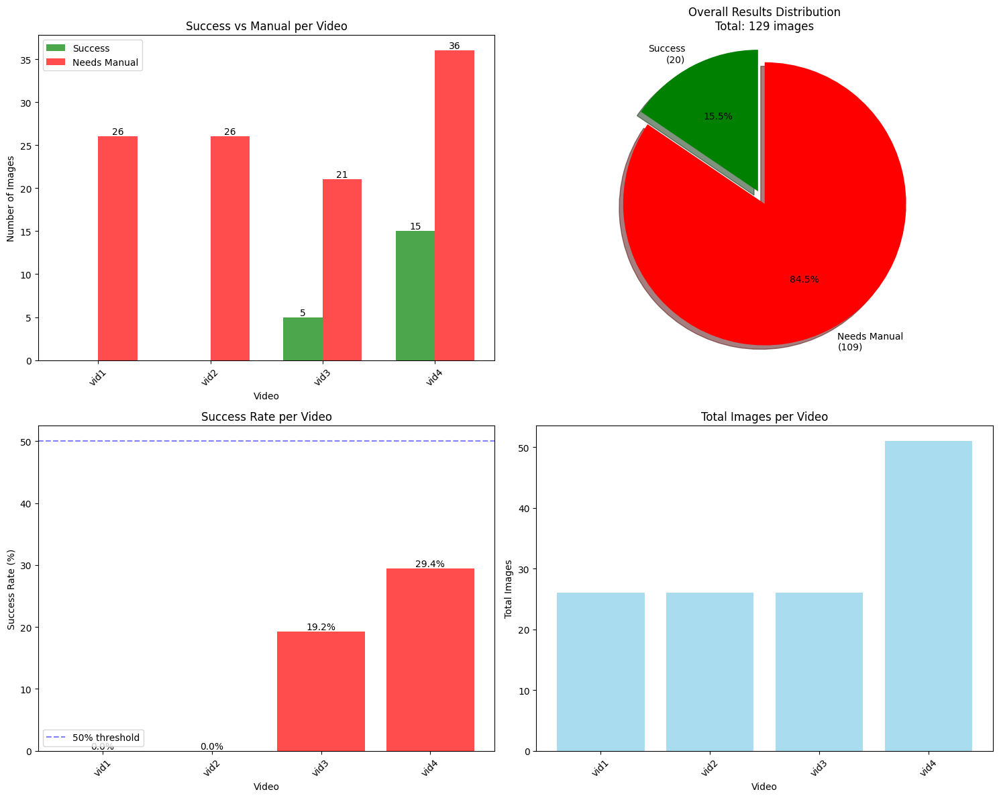


Analyzing metrics...


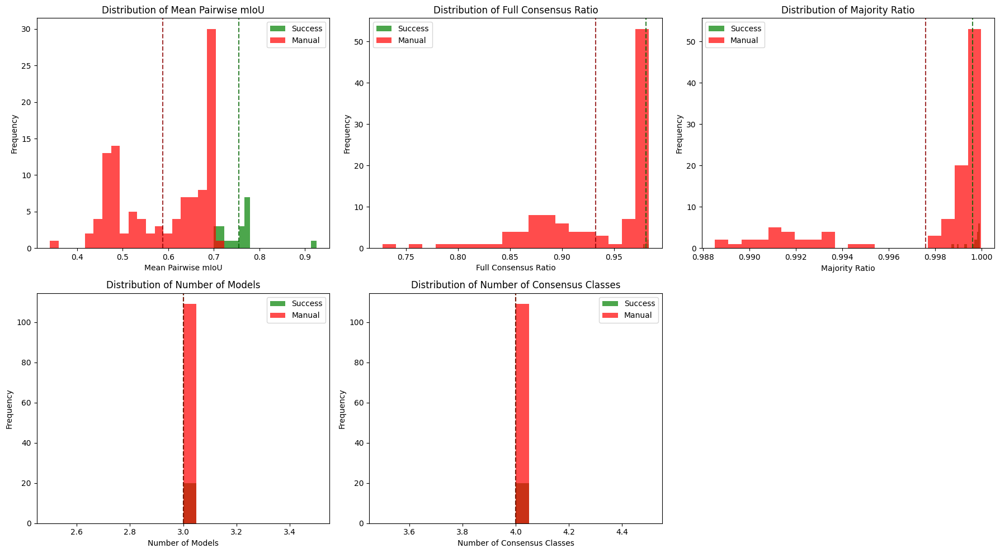


METRICS SUMMARY

SUCCESS images (20 images):
  Mean Pairwise mIoU:
    Mean: 0.755
    Std:  0.049
    Min:  0.700
    Max:  0.925
  Full Consensus Ratio:
    Mean: 0.981
    Std:  0.002
    Min:  0.977
    Max:  0.984
  Majority Ratio:
    Mean: 1.000
    Std:  0.000
    Min:  0.999
    Max:  1.000
  Number of Models:
    Mean: 3.000
    Std:  0.000
    Min:  3.000
    Max:  3.000
  Number of Consensus Classes:
    Mean: 4.000
    Std:  0.000
    Min:  4.000
    Max:  4.000

MANUAL images (109 images):
  Mean Pairwise mIoU:
    Mean: 0.588
    Std:  0.099
    Min:  0.340
    Max:  0.723
  Full Consensus Ratio:
    Mean: 0.932
    Std:  0.058
    Min:  0.727
    Max:  0.983
  Majority Ratio:
    Mean: 0.998
    Std:  0.003
    Min:  0.989
    Max:  1.000
  Number of Models:
    Mean: 3.000
    Std:  0.000
    Min:  3.000
    Max:  3.000
  Number of Consensus Classes:
    Mean: 4.000
    Std:  0.000
    Min:  4.000
    Max:  4.000

Generating sample visualizations...
Saved visualizatio

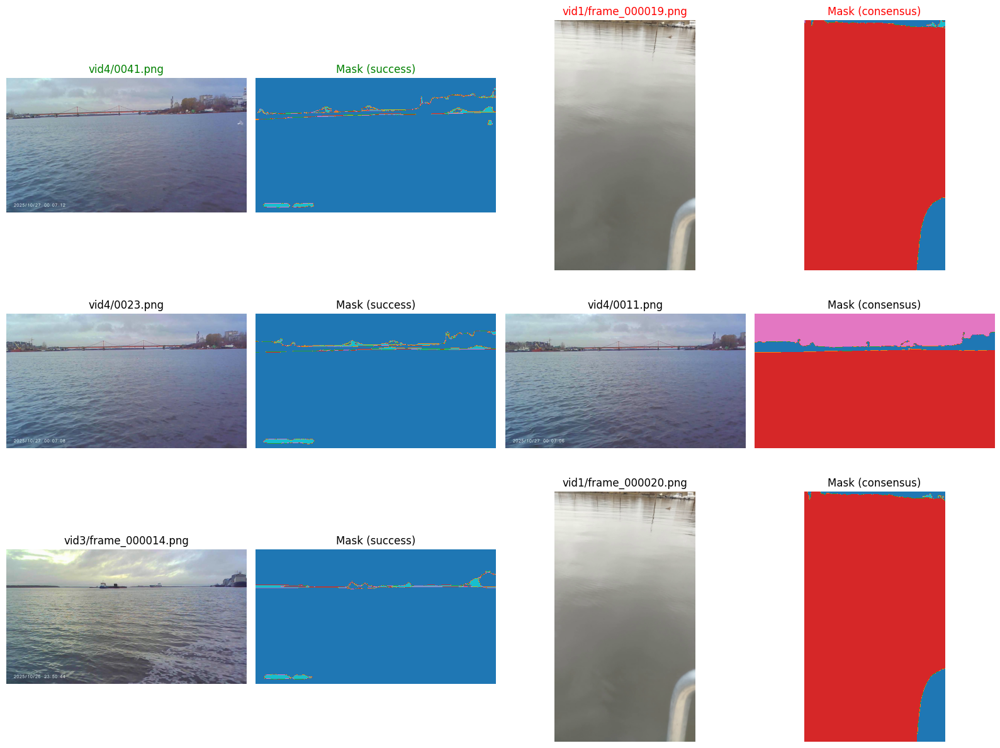


Analyzing rejection reasons...

REJECTION REASONS ANALYSIS
                    Reason  Count
  Consensus mask available    109
Low agreement (mIoU < 0.5)     35


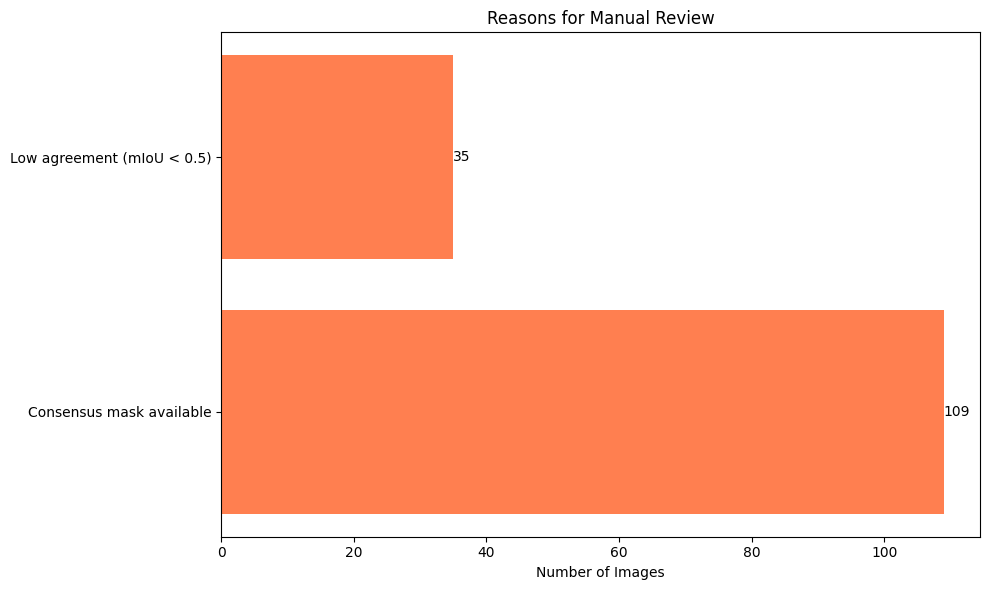


✅ Report generated in: /workspace/data/automarkup_results/report
Files created:
  - overview.png
  - metrics_distribution.png
  - sample_visualizations.png
  - video_statistics.csv
  - metrics_data.csv


In [ ]:
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import json
from collections import defaultdict, Counter
import pandas as pd
from scipy import stats as scipy_stats
import seaborn as sns

class AutoMarkupAnalyzer:
    def __init__(self, results_dir='/workspace/data/automarkup_results'):
        self.results_dir = Path(results_dir)
        self.success_dir = self.results_dir / 'success'
        self.manual_dir = self.results_dir / 'needs_manual'
        
    def load_summary(self):
        """Загружает общую статистику"""
        summary_path = self.results_dir / 'summary.json'
        if summary_path.exists():
            with open(summary_path, 'r') as f:
                return json.load(f)
        return None
    
    def get_per_video_stats(self):
        """Собирает статистику по каждому видео"""
        video_stats = {}
        
        # Статистика успешных
        for vid_dir in self.success_dir.glob('vid*'):
            vid_name = vid_dir.name
            if vid_name not in video_stats:
                video_stats[vid_name] = {'success': 0, 'manual': 0, 'total': 0}
            
            masks_dir = vid_dir / 'masks'
            if masks_dir.exists():
                video_stats[vid_name]['success'] = len(list(masks_dir.glob('*.png')))
        
        # Статистика неуспешных
        for vid_dir in self.manual_dir.glob('vid*'):
            vid_name = vid_dir.name
            if vid_name not in video_stats:
                video_stats[vid_name] = {'success': 0, 'manual': 0, 'total': 0}
            
            images_dir = vid_dir / 'images'
            if images_dir.exists():
                # Считаем только оригинальные изображения, не info файлы
                manual_count = len([f for f in images_dir.glob('*.png') if not f.stem.endswith('_info')])
                video_stats[vid_name]['manual'] = manual_count
        
        # Вычисляем totals
        for vid_name in video_stats:
            video_stats[vid_name]['total'] = video_stats[vid_name]['success'] + video_stats[vid_name]['manual']
            video_stats[vid_name]['success_rate'] = (
                video_stats[vid_name]['success'] / video_stats[vid_name]['total'] * 100 
                if video_stats[vid_name]['total'] > 0 else 0
            )
        
        return video_stats
    
    def analyze_metrics(self):
        """Анализирует метрики качества разметки"""
        all_metrics = []
        
        # Собираем метрики успешных
        for metrics_file in self.success_dir.glob('vid*/masks/*_metrics.json'):
            with open(metrics_file, 'r') as f:
                metrics = json.load(f)
            
            vid_name = metrics_file.parent.parent.name
            img_name = metrics_file.stem.replace('_metrics', '')
            
            metrics_data = {
                'video': vid_name,
                'image': img_name,
                'status': 'success',
                'mean_pairwise_miou': metrics.get('mean_pairwise_miou', 0),
                'full_consensus_ratio': metrics.get('full_consensus_ratio', 0),
                'majority_ratio': metrics.get('majority_ratio', 0),
                'num_models': metrics.get('num_models', 0),
                'num_consensus_classes': len(metrics.get('consensus_classes', []))
            }
            
            # Добавляем per-class IoU
            per_class_iou = metrics.get('per_class_iou', [])
            for cls_idx, iou in enumerate(per_class_iou):
                if not np.isnan(iou):
                    metrics_data[f'class_{cls_idx}_iou'] = iou
            
            all_metrics.append(metrics_data)
        
        # Собираем метрики неуспешных
        for info_file in self.manual_dir.glob('vid*/images/*_info.json'):
            with open(info_file, 'r') as f:
                info = json.load(f)
            
            metrics = info.get('metrics', {})
            if metrics:
                vid_name = info_file.parent.parent.name
                img_name = info_file.stem.replace('_info', '')
                
                metrics_data = {
                    'video': vid_name,
                    'image': img_name,
                    'status': 'manual',
                    'mean_pairwise_miou': metrics.get('mean_pairwise_miou', 0),
                    'full_consensus_ratio': metrics.get('full_consensus_ratio', 0),
                    'majority_ratio': metrics.get('majority_ratio', 0),
                    'num_models': metrics.get('num_models', 0),
                    'num_consensus_classes': len(metrics.get('consensus_classes', []))
                }
                
                # Добавляем per-class IoU
                per_class_iou = metrics.get('per_class_iou', [])
                for cls_idx, iou in enumerate(per_class_iou):
                    if not np.isnan(iou):
                        metrics_data[f'class_{cls_idx}_iou'] = iou
                
                all_metrics.append(metrics_data)
        
        return pd.DataFrame(all_metrics)
    
    def visualize_results_overview(self, save_path=None):
        """Визуализирует общий обзор результатов"""
        video_stats = self.get_per_video_stats()
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        # 1. Bar chart: Success vs Manual per video
        ax1 = axes[0, 0]
        videos = sorted(video_stats.keys())
        success_counts = [video_stats[v]['success'] for v in videos]
        manual_counts = [video_stats[v]['manual'] for v in videos]
        
        x = range(len(videos))
        width = 0.35
        bars1 = ax1.bar([i - width/2 for i in x], success_counts, width, label='Success', color='green', alpha=0.7)
        bars2 = ax1.bar([i + width/2 for i in x], manual_counts, width, label='Needs Manual', color='red', alpha=0.7)
        
        ax1.set_xlabel('Video')
        ax1.set_ylabel('Number of Images')
        ax1.set_title('Success vs Manual per Video')
        ax1.set_xticks(x)
        ax1.set_xticklabels(videos, rotation=45)
        ax1.legend()
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax1.text(bar.get_x() + bar.get_width()/2., height,
                            f'{int(height)}', ha='center', va='bottom')
        
        # 2. Pie chart: Overall success rate
        ax2 = axes[0, 1]
        total_success = sum(video_stats[v]['success'] for v in videos)
        total_manual = sum(video_stats[v]['manual'] for v in videos)
        
        sizes = [total_success, total_manual]
        labels = [f'Success\n({total_success})', f'Needs Manual\n({total_manual})']
        colors = ['green', 'red']
        explode = (0.05, 0.05)
        
        ax2.pie(sizes, explode=explode, labels=labels, colors=colors, 
                autopct='%1.1f%%', shadow=True, startangle=90)
        ax2.set_title(f'Overall Results Distribution\nTotal: {total_success + total_manual} images')
        ax2.axis('equal')
        
        # 3. Success rate per video
        ax3 = axes[1, 0]
        success_rates = [video_stats[v]['success_rate'] for v in videos]
        colors_bar = ['green' if rate >= 50 else 'orange' if rate >= 30 else 'red' 
                     for rate in success_rates]
        
        bars = ax3.bar(videos, success_rates, color=colors_bar, alpha=0.7)
        ax3.set_xlabel('Video')
        ax3.set_ylabel('Success Rate (%)')
        ax3.set_title('Success Rate per Video')
        ax3.set_xticklabels(videos, rotation=45)
        ax3.axhline(y=50, color='blue', linestyle='--', alpha=0.5, label='50% threshold')
        ax3.legend()
        
        # Add value labels
        for bar, rate in zip(bars, success_rates):
            ax3.text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                    f'{rate:.1f}%', ha='center', va='bottom')
        
        # 4. Total images per video
        ax4 = axes[1, 1]
        totals = [video_stats[v]['total'] for v in videos]
        ax4.bar(videos, totals, color='skyblue', alpha=0.7)
        ax4.set_xlabel('Video')
        ax4.set_ylabel('Total Images')
        ax4.set_title('Total Images per Video')
        ax4.set_xticklabels(videos, rotation=45)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
        
        plt.show()
        
    def visualize_metrics_distribution(self, save_path=None):
        """Визуализирует распределение метрик"""
        df = self.analyze_metrics()
        
        if df.empty:
            print("No metrics data available")
            return
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        
        metrics_to_plot = [
            ('mean_pairwise_miou', 'Mean Pairwise mIoU'),
            ('full_consensus_ratio', 'Full Consensus Ratio'),
            ('majority_ratio', 'Majority Ratio'),
            ('num_models', 'Number of Models'),
            ('num_consensus_classes', 'Number of Consensus Classes')
        ]
        
        for idx, (metric, title) in enumerate(metrics_to_plot):
            if idx < 5:
                ax = axes.flat[idx]
                
                # Separate success and manual
                success_data = df[df['status'] == 'success'][metric]
                manual_data = df[df['status'] == 'manual'][metric]
                
                if not success_data.empty:
                    ax.hist(success_data, bins=20, alpha=0.7, label='Success', color='green')
                if not manual_data.empty:
                    ax.hist(manual_data, bins=20, alpha=0.7, label='Manual', color='red')
                
                ax.set_xlabel(title)
                ax.set_ylabel('Frequency')
                ax.set_title(f'Distribution of {title}')
                ax.legend()
                
                # Add vertical lines for means
                if not success_data.empty:
                    ax.axvline(success_data.mean(), color='darkgreen', linestyle='--', alpha=0.8)
                if not manual_data.empty:
                    ax.axvline(manual_data.mean(), color='darkred', linestyle='--', alpha=0.8)
        
        # Hide unused subplot
        axes[1, 2].axis('off')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
        
        plt.show()
        
        # Print summary statistics
        print("\n" + "="*50)
        print("METRICS SUMMARY")
        print("="*50)
        
        for status in ['success', 'manual']:
            status_df = df[df['status'] == status]
            if not status_df.empty:
                print(f"\n{status.upper()} images ({len(status_df)} images):")
                for metric, title in metrics_to_plot:
                    if metric in status_df.columns:
                        print(f"  {title}:")
                        print(f"    Mean: {status_df[metric].mean():.3f}")
                        print(f"    Std:  {status_df[metric].std():.3f}")
                        print(f"    Min:  {status_df[metric].min():.3f}")
                        print(f"    Max:  {status_df[metric].max():.3f}")
    
    def visualize_sample_images(self, num_samples=5, mode='random', save_dir=None):
        """Визуализирует примеры успешных и неуспешных разметок"""
        
        # Collect successful samples
        success_samples = []
        for img_path in self.success_dir.glob('vid*/images/*.png'):
            mask_path = img_path.parent.parent / 'masks' / f"{img_path.stem}.png"
            if mask_path.exists():
                success_samples.append((img_path, mask_path, 'success'))
        
        # Collect manual samples
        manual_samples = []
        for img_path in self.manual_dir.glob('vid*/images/*.png'):
            if '_info' not in img_path.stem:
                vid_name = img_path.parent.parent.name
                img_name = img_path.stem
                
                # Check for consensus mask
                consensus_mask = self.manual_dir / vid_name / 'masks' / f"{img_name}_consensus.png"
                uncertain_mask = self.manual_dir / vid_name / 'masks' / f"{img_name}_uncertain.png"
                
                mask_path = None
                if consensus_mask.exists():
                    mask_path = consensus_mask
                elif uncertain_mask.exists():
                    mask_path = uncertain_mask
                
                manual_samples.append((img_path, mask_path, 'manual'))
        
        # Select samples
        if mode == 'random':
            import random
            success_to_show = random.sample(success_samples, min(num_samples, len(success_samples)))
            manual_to_show = random.sample(manual_samples, min(num_samples, len(manual_samples)))
        else:  # first
            success_to_show = success_samples[:num_samples]
            manual_to_show = manual_samples[:num_samples]
        
        # Visualize
        nrows = max(len(success_to_show), len(manual_to_show))
        if nrows == 0:
            print("No samples to visualize")
            return
        
        fig, axes = plt.subplots(nrows, 4, figsize=(16, 4*nrows))
        
        if nrows == 1:
            axes = axes.reshape(1, -1)
        
        # Set column titles
        axes[0, 0].set_title('Success: Original', fontsize=12, fontweight='bold', color='green')
        axes[0, 1].set_title('Success: Mask', fontsize=12, fontweight='bold', color='green')
        axes[0, 2].set_title('Manual: Original', fontsize=12, fontweight='bold', color='red')
        axes[0, 3].set_title('Manual: Mask', fontsize=12, fontweight='bold', color='red')
        
        # Plot success samples
        for i, (img_path, mask_path, _) in enumerate(success_to_show):
            if i < nrows:
                # Original image
                img = Image.open(img_path)
                axes[i, 0].imshow(img)
                axes[i, 0].set_title(f'{img_path.parent.parent.name}/{img_path.name}')
                axes[i, 0].axis('off')
                
                # Mask
                if mask_path.exists():
                    mask = Image.open(mask_path)
                    axes[i, 1].imshow(mask, cmap='tab10')
                    axes[i, 1].set_title('Mask (success)')
                axes[i, 1].axis('off')
        
        # Plot manual samples
        for i, (img_path, mask_path, _) in enumerate(manual_to_show):
            if i < nrows:
                # Original image
                img = Image.open(img_path)
                axes[i, 2].imshow(img)
                axes[i, 2].set_title(f'{img_path.parent.parent.name}/{img_path.name}')
                axes[i, 2].axis('off')
                
                # Mask
                if mask_path and mask_path.exists():
                    mask = Image.open(mask_path)
                    axes[i, 3].imshow(mask, cmap='tab10')
                    
                    mask_type = mask_path.stem.split('_')[-1]
                    axes[i, 3].set_title(f'Mask ({mask_type})')
                axes[i, 3].axis('off')
        
        plt.tight_layout()
        
        if save_dir:
            save_path = Path(save_dir) / 'sample_visualizations.png'
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"Saved visualization to {save_path}")
        
        plt.show()
    
    def analyze_rejection_reasons(self):
        """Анализирует причины отправки на ручную разметку"""
        reasons = defaultdict(int)
        
        for info_file in self.manual_dir.glob('vid*/images/*_info.json'):
            with open(info_file, 'r') as f:
                info = json.load(f)
            
            # Анализируем метрики для понимания причин
            metrics = info.get('metrics', {})
            
            mean_iou = metrics.get('mean_pairwise_miou', 0)
            consensus_ratio = metrics.get('full_consensus_ratio', 0)
            majority_ratio = metrics.get('majority_ratio', 0)
            
            if mean_iou < 0.5:
                reasons['Low agreement (mIoU < 0.5)'] += 1
            if consensus_ratio < 0.5:
                reasons['Low full consensus (< 50%)'] += 1
            if majority_ratio < 0.7:
                reasons['Low majority agreement (< 70%)'] += 1
            
            # Check if mask was available
            if info.get('mask_available'):
                reasons['Mask available but rejected'] += 1
            
            # Check consensus
            if info.get('consensus_available'):
                reasons['Consensus mask available'] += 1
            else:
                reasons['No consensus mask'] += 1
        
        print("\n" + "="*50)
        print("REJECTION REASONS ANALYSIS")
        print("="*50)
        
        df_reasons = pd.DataFrame(list(reasons.items()), columns=['Reason', 'Count'])
        df_reasons = df_reasons.sort_values('Count', ascending=False)
        
        print(df_reasons.to_string(index=False))
        
        # Visualize
        fig, ax = plt.subplots(figsize=(10, 6))
        bars = ax.barh(df_reasons['Reason'], df_reasons['Count'], color='coral')
        ax.set_xlabel('Number of Images')
        ax.set_title('Reasons for Manual Review')
        
        for bar in bars:
            width = bar.get_width()
            ax.text(width, bar.get_y() + bar.get_height()/2, 
                   f'{int(width)}', ha='left', va='center')
        
        plt.tight_layout()
        plt.show()
        
        return df_reasons
    
    def generate_full_report(self, output_dir='/workspace/data/automarkup_results/report'):
        """Генерирует полный отчет с визуализациями"""
        output_path = Path(output_dir)
        output_path.mkdir(parents=True, exist_ok=True)
        
        print("Generating full analysis report...")
        print("="*50)
        
        # 1. Load and display summary
        summary = self.load_summary()
        if summary:
            print("\nOVERALL SUMMARY:")
            print(json.dumps(summary, indent=2))
        
        # 2. Per video statistics
        print("\n" + "="*50)
        print("PER VIDEO STATISTICS:")
        print("="*50)
        video_stats = self.get_per_video_stats()
        df_video = pd.DataFrame(video_stats).T
        df_video = df_video.sort_index()
        print(df_video.to_string())
        
        # 3. Visualize overview
        print("\nGenerating overview visualization...")
        self.visualize_results_overview(save_path=output_path / 'overview.png')
        
        # 4. Metrics analysis
        print("\nAnalyzing metrics...")
        self.visualize_metrics_distribution(save_path=output_path / 'metrics_distribution.png')
        
        # 5. Sample visualizations
        print("\nGenerating sample visualizations...")
        self.visualize_sample_images(num_samples=3, save_dir=output_path)
        
        # 6. Rejection reasons
        print("\nAnalyzing rejection reasons...")
        self.analyze_rejection_reasons()
        
        # Save all data
        df_video.to_csv(output_path / 'video_statistics.csv')
        
        metrics_df = self.analyze_metrics()
        if not metrics_df.empty:
            metrics_df.to_csv(output_path / 'metrics_data.csv', index=False)
        
        print(f"\n✅ Report generated in: {output_path}")
        print("Files created:")
        print(f"  - overview.png")
        print(f"  - metrics_distribution.png")
        print(f"  - sample_visualizations.png")
        print(f"  - video_statistics.csv")
        print(f"  - metrics_data.csv")


analyzer = AutoMarkupAnalyzer('/workspace/data/automarkup_results')
analyzer.generate_full_report()

# analyzer.visualize_results_overview()
# analyzer.visualize_metrics_distribution()
# analyzer.visualize_sample_images(num_samples=5)
# analyzer.analyze_rejection_reasons()

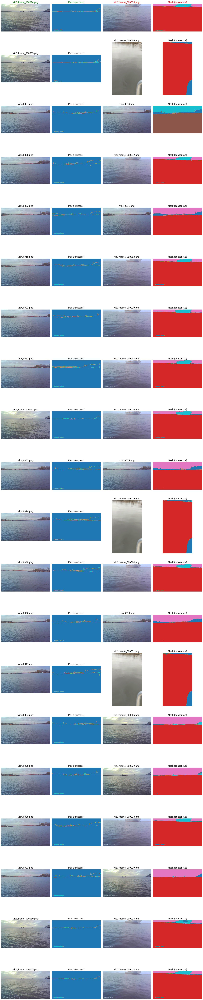

In [ ]:
analyzer.visualize_sample_images(num_samples=20)

In [ ]:
import os
import numpy as np

def print_best_val_miou(directory):
    """
    Выводит лучший val_mIoU для всех history-файлов в указанной директории.
    """
    history_files = [f for f in os.listdir(directory) if f.endswith('_history.npy')]
    
    results = []
    for hf in sorted(history_files):
        path = os.path.join(directory, hf)
        history = np.load(path, allow_pickle=True).item()
        
        model_name = hf.replace('_history.npy', '')
        
        if 'val_miou' in history:
            val_miou = history['val_miou']
            best_miou = max(val_miou)
            best_epoch = np.argmax(val_miou) + 1
            results.append((best_miou, model_name, best_epoch, len(val_miou)))
            print(f"{model_name}: best val_mIoU = {best_miou:.4f} (epoch {best_epoch}/{len(val_miou)})")
        else:
            print(f"{model_name}: val_miou not found in history")
    
    # Вывод лучшей модели
    if results:
        best = max(results, key=lambda x: x[0])
        print(f"\n=== Лучшая модель: {best[1]} с val_mIoU = {best[0]:.4f} (epoch {best[2]}/{best[3]}) ===")

print_best_val_miou("/workspace/output")

BEiT_Base_224x224: best val_mIoU = 0.6341 (epoch 5/5)
BEiT_Base_improved_train3: best val_mIoU = 0.6377 (epoch 9/9)
Mask2Former_SwinB_256x256: best val_mIoU = 0.0517 (epoch 5/5)
Mask2Former_SwinB_improved_train: best val_mIoU = 0.7065 (epoch 6/6)
SegFormer_B5_256x256: best val_mIoU = 0.6981 (epoch 12/12)
SegFormer_B5_improved_train2: best val_mIoU = 0.7505 (epoch 19/22)

=== Лучшая модель: SegFormer_B5_improved_train2 с val_mIoU = 0.7505 (epoch 19/22) ===


In [70]:
# Решаем проблемму с классами
cvat_to_lars_mapping = {
    1: 0,   # Pier -> Static Obstacle (условно, подумай логически)
    2: 0,   # Bridge -> Static Obstacle
    3: 1,   # Water -> Water
    4: 2,   # Sky -> Sky
    5: 0,   # Land -> Static Obstacle (берег — препятствие)
    6: 3,   # Vessel -> Boat/ship
    7: 6,   # Buoy -> Buoy
    8: 10,  # LandingMark -> Other (или 0? зависит от задачи)
    9: 10,  # BridgeLight -> Other
    10: 10, # Other -> Other
    11: 0,  # Void -> игнорируем (255)
}

In [ ]:
vid_path_manual = "/workspace/data/manual_markup/coco1_0_03/"
vid_path_auto = "/workspace/data/automarkup_results/success/vid3/"
vid_path_relearn = "/workspace/data/relearn/vid3/"

In [82]:
# Конвертируем маски ручной разметки
import json
import numpy as np
from PIL import Image
import os
from pycocotools import mask as mask_utils

# Загружаем COCO JSON
with open(vid_path_manual+'annotations/instances_default.json') as f:
    coco = json.load(f)

# Строим mapping 
cvat_categories = {cat['id']: cat['name'] for cat in coco['categories']}
# cvat_to_lars = {1:0, 2:0, 3:1, 4:2, 5:0, 6:3, 7:6, 8:10, 9:10, 10:10, 11:255}

# Строим словарь: image_id -> {имя_файла, размеры}
images_info = {img['id']: img for img in coco['images']}

# Группируем аннотации по image_id
from collections import defaultdict
anns_by_image = defaultdict(list)
for ann in coco['annotations']:
    anns_by_image[ann['image_id']].append(ann)

output_masks_dir = vid_path_manual+'converted_masks/panoptic_masks'
os.makedirs(output_masks_dir, exist_ok=True)

for img_id, img_info in images_info.items():
    h, w = img_info['height'], img_info['width']
    mask = np.zeros((h, w), dtype=np.uint8)
    
    for ann in anns_by_image[img_id]:
        cvat_cat_id = ann['category_id']
        lars_id = cvat_to_lars_mapping.get(cvat_cat_id, 10)  # default Other
        
        if isinstance(ann['segmentation'], list):
            # Polygon
            rle = mask_utils.frPyObjects(ann['segmentation'], h, w)
            ann_mask = mask_utils.decode(rle)
            # rle для одного полигона — уже 2D, но если полигонов несколько — 3D
            if ann_mask.ndim == 3:
                ann_mask = np.any(ann_mask, axis=2)  # объединить все полигоны в одну маску
        else:
            # RLE (тут обычно 2D или тоже может быть 3D, но реже)
            ann_mask = mask_utils.decode(ann['segmentation'])
            if ann_mask.ndim == 3:
                ann_mask = np.any(ann_mask, axis=2)
        
        # ann_mask теперь гарантированно 2D бинарная маска
        mask[ann_mask > 0] = lars_id
    
    # Сохраняем маску
    img_filename = img_info['file_name']  # например "default/frame_000000.png"
    mask_filename = os.path.basename(img_filename)  # frame_000000.png
    Image.fromarray(mask).save(os.path.join(output_masks_dir, mask_filename))

In [83]:
# Делаем слияние
import os
import shutil
from pathlib import Path

# Пути
auto_images = vid_path_auto+"images"
auto_masks = vid_path_auto+"masks"
manual_images = vid_path_manual+"images/default"
manual_masks = vid_path_manual+"converted_masks/panoptic_masks"

output_images = vid_path_relearn+"images"
output_masks = vid_path_relearn+"panoptic_masks"

os.makedirs(output_images, exist_ok=True)
os.makedirs(output_masks, exist_ok=True)

# Собираем список файлов авторазметки (только .png маски, не metrics)
auto_mask_files = set()
for f in os.listdir(auto_masks):
    if f.endswith('.png') and not f.endswith('_metrics.json'):
        auto_mask_files.add(f)

# Собираем список файлов ручной разметки
manual_mask_files = set(os.listdir(manual_masks))

print(f"Авторазметка: {sorted(auto_mask_files)}")
print(f"Ручная разметка: {sorted(manual_mask_files)}")

# 1. Копируем ВСЁ из авторазметки (и картинки, и маски)
for mask_file in auto_mask_files:
    # Маска
    src_mask = os.path.join(auto_masks, mask_file)
    dst_mask = os.path.join(output_masks, mask_file)
    shutil.copy2(src_mask, dst_mask)
    print(f"[AUTO] Маска: {mask_file}")
    
    # Картинка
    src_img = os.path.join(auto_images, mask_file)
    dst_img = os.path.join(output_images, mask_file)
    if os.path.exists(src_img):
        shutil.copy2(src_img, dst_img)
        print(f"[AUTO] Картинка: {mask_file}")

# 2. Добавляем ручную разметку, только если файла нет в авторазметке
added_manual = 0
for mask_file in sorted(manual_mask_files):
    if mask_file not in auto_mask_files:
        # Маска
        src_mask = os.path.join(manual_masks, mask_file)
        dst_mask = os.path.join(output_masks, mask_file)
        shutil.copy2(src_mask, dst_mask)
        
        # Картинка
        src_img = os.path.join(manual_images, mask_file)
        dst_img = os.path.join(output_images, mask_file)
        if os.path.exists(src_img):
            shutil.copy2(src_img, dst_img)
            print(f"[MANUAL] Добавлен: {mask_file}")
            added_manual += 1
        else:
            print(f"[WARNING] Нет картинки для {mask_file}")
    else:
        print(f"[SKIP] Уже есть в авторазметке: {mask_file}")

# Итоги
total_images = len(os.listdir(output_images))
total_masks = len(os.listdir(output_masks))
print(f"\nГотово!")
print(f"Всего картинок: {total_images}")
print(f"Всего масок: {total_masks}")
print(f"Из них авторазметка: {len(auto_mask_files)}")
print(f"Добавлено из ручной: {added_manual}")

Авторазметка: ['frame_000003.png', 'frame_000005.png', 'frame_000010.png', 'frame_000013.png', 'frame_000014.png']
Ручная разметка: ['frame_000000.png', 'frame_000001.png', 'frame_000002.png', 'frame_000003.png', 'frame_000004.png', 'frame_000005.png', 'frame_000006.png', 'frame_000007.png', 'frame_000008.png', 'frame_000009.png', 'frame_000010.png', 'frame_000011.png', 'frame_000012.png', 'frame_000013.png', 'frame_000014.png', 'frame_000015.png', 'frame_000016.png', 'frame_000017.png', 'frame_000018.png', 'frame_000019.png', 'frame_000020.png', 'frame_000021.png', 'frame_000022.png', 'frame_000023.png', 'frame_000024.png', 'frame_000025.png']
[AUTO] Маска: frame_000003.png
[AUTO] Картинка: frame_000003.png
[AUTO] Маска: frame_000013.png
[AUTO] Картинка: frame_000013.png
[AUTO] Маска: frame_000010.png
[AUTO] Картинка: frame_000010.png
[AUTO] Маска: frame_000014.png
[AUTO] Картинка: frame_000014.png
[AUTO] Маска: frame_000005.png
[AUTO] Картинка: frame_000005.png
[MANUAL] Добавлен: fra

In [85]:
#vid4
import json
import numpy as np
from PIL import Image
import os
import shutil
from collections import defaultdict
from pycocotools import mask as mask_utils

# ============================================
# НАСТРОЙКИ (поменяй пути под своё видео)
# ============================================
vid_path_manual = "/workspace/data/manual_markup/coco1_0_04/"
vid_path_auto = "/workspace/data/automarkup_results/success/vid4/"
vid_path_relearn = "/workspace/data/relearn/vid4/"

# mapping id_ручной -> id_твоей_модели
cvat_to_lars_mapping = {
    1: 0,   # Pier -> Static Obstacle
    2: 0,   # Bridge -> Static Obstacle
    3: 1,   # Water -> Water
    4: 2,   # Sky -> Sky
    5: 0,   # Land -> Static Obstacle
    6: 3,   # Vessel -> Boat/ship
    7: 6,   # Buoy -> Buoy
    8: 10,  # LandingMark -> Other
    9: 10,  # BridgeLight -> Other
    10: 10, # Other -> Other
    11: 0,  # Void -> Static Obstacle (или 255 для ignore)
}

# ============================================
# ШАГ 1: Конвертация ручной разметки
# ============================================
print("1. Конвертирую ручную разметку...")

with open(vid_path_manual + 'annotations/instances_default.json') as f:
    coco = json.load(f)

images_info = {img['id']: img for img in coco['images']}

anns_by_image = defaultdict(list)
for ann in coco['annotations']:
    anns_by_image[ann['image_id']].append(ann)

output_masks_dir = vid_path_manual + 'converted_masks/panoptic_masks'
os.makedirs(output_masks_dir, exist_ok=True)

for img_id, img_info in images_info.items():
    h, w = img_info['height'], img_info['width']
    mask = np.zeros((h, w), dtype=np.uint8)
    
    for ann in anns_by_image[img_id]:
        cvat_cat_id = ann['category_id']
        lars_id = cvat_to_lars_mapping.get(cvat_cat_id, 10)
        
        if isinstance(ann['segmentation'], list):
            rle = mask_utils.frPyObjects(ann['segmentation'], h, w)
            ann_mask = mask_utils.decode(rle)
            if ann_mask.ndim == 3:
                ann_mask = np.any(ann_mask, axis=2)
        else:
            ann_mask = mask_utils.decode(ann['segmentation'])
            if ann_mask.ndim == 3:
                ann_mask = np.any(ann_mask, axis=2)
        
        mask[ann_mask > 0] = lars_id
    
    # ИСПРАВЛЕНИЕ: меняем расширение на .png и добавляем префикс frame_
    img_filename = img_info['file_name']  # например "default/0001.jpeg"
    base_name = os.path.splitext(os.path.basename(img_filename))[0]  # "0001"
    mask_filename = f"frame_{int(base_name):06d}.png"  # "frame_000001.png"
    
    Image.fromarray(mask).save(os.path.join(output_masks_dir, mask_filename))
    print(f"  Создана маска: {mask_filename}")

# ============================================
# ШАГ 2: Переименование авторазметки и копирование
# ============================================
print("\n2. Копирую и переименовываю авторазметку...")

output_images = vid_path_relearn + "images"
output_masks = vid_path_relearn + "panoptic_masks"
os.makedirs(output_images, exist_ok=True)
os.makedirs(output_masks, exist_ok=True)

# Функция переименования: 0001.png -> frame_000001.png
def rename_to_frame(name):
    base = os.path.splitext(name)[0]  # "0001"
    return f"frame_{int(base):06d}.png"

# Авторазметка: копируем маски (только .png, не _metrics.json)
auto_mask_files = []
for f in os.listdir(vid_path_auto + "masks"):
    if f.endswith('.png') and not f.endswith('_metrics.json'):
        auto_mask_files.append(f)

print(f"  Найдено масок авторазметки: {len(auto_mask_files)}")

for mask_file in auto_mask_files:
    new_name = rename_to_frame(mask_file)
    
    # Копируем маску с новым именем
    src_mask = os.path.join(vid_path_auto, "masks", mask_file)
    dst_mask = os.path.join(output_masks, new_name)
    shutil.copy2(src_mask, dst_mask)
    
    # Копируем картинку с новым именем
    # (в авторазметке картинки могут быть .png или .jpeg)
    src_img = os.path.join(vid_path_auto, "images", mask_file)
    dst_img = os.path.join(output_images, new_name)
    if os.path.exists(src_img):
        img = Image.open(src_img)
        img.save(dst_img)
    else:
        print(f"  [WARNING] Нет картинки: {mask_file}")
    
    print(f"  [AUTO] {mask_file} -> {new_name}")

# ============================================
# ШАГ 3: Добавление ручной разметки
# ============================================
print("\n3. Добавляю ручную разметку (только новые кадры)...")

manual_masks_dir = vid_path_manual + "converted_masks/panoptic_masks"
manual_images_dir = vid_path_manual + "images/default"

# Какие маски уже есть после авторазметки
existing_masks = set(os.listdir(output_masks))

added = 0
for mask_file in sorted(os.listdir(manual_masks_dir)):
    if mask_file not in existing_masks:
        # Копируем маску
        shutil.copy2(
            os.path.join(manual_masks_dir, mask_file),
            os.path.join(output_masks, mask_file)
        )
        
        # Ищем соответствующую картинку в ручной разметке
        # (оригинальное имя может быть 0001.jpeg)
        orig_num = mask_file.replace("frame_", "").replace(".png", "")  # "000001"
        orig_name_jpeg = f"{int(orig_num):04d}.jpeg"
        orig_name_png = f"{int(orig_num):04d}.png"
        
        src_img = None
        if os.path.exists(os.path.join(manual_images_dir, orig_name_jpeg)):
            src_img = os.path.join(manual_images_dir, orig_name_jpeg)
        elif os.path.exists(os.path.join(manual_images_dir, orig_name_png)):
            src_img = os.path.join(manual_images_dir, orig_name_png)
        
        if src_img:
            img = Image.open(src_img)
            img.save(os.path.join(output_images, mask_file))
            print(f"  [MANUAL] {mask_file}")
            added += 1
        else:
            print(f"  [WARNING] Нет картинки для {mask_file}")

# ============================================
# ИТОГИ
# ============================================
print(f"\nГотово!")
print(f"Картинок: {len(os.listdir(output_images))}")
print(f"Масок: {len(os.listdir(output_masks))}")
print(f"Авторазметка: {len(auto_mask_files)}")
print(f"Добавлено ручной: {added}")

1. Конвертирую ручную разметку...
  Создана маска: frame_000001.png
  Создана маска: frame_000002.png
  Создана маска: frame_000003.png
  Создана маска: frame_000004.png
  Создана маска: frame_000005.png
  Создана маска: frame_000006.png
  Создана маска: frame_000007.png
  Создана маска: frame_000008.png
  Создана маска: frame_000009.png
  Создана маска: frame_000010.png
  Создана маска: frame_000011.png
  Создана маска: frame_000012.png
  Создана маска: frame_000013.png
  Создана маска: frame_000014.png
  Создана маска: frame_000015.png
  Создана маска: frame_000016.png
  Создана маска: frame_000017.png
  Создана маска: frame_000018.png
  Создана маска: frame_000019.png
  Создана маска: frame_000020.png
  Создана маска: frame_000021.png
  Создана маска: frame_000022.png
  Создана маска: frame_000023.png
  Создана маска: frame_000024.png
  Создана маска: frame_000025.png
  Создана маска: frame_000026.png
  Создана маска: frame_000027.png
  Создана маска: frame_000028.png
  Создана маск

In [ ]:
import os
from PIL import Image

manual_images_dir = "/workspace/data/manual_markup/coco1_0_04/images/default"
output_images = "/workspace/data/relearn/vid4/images"
output_masks = "/workspace/data/relearn/vid4/panoptic_masks"

added = 0
for mask_file in sorted(os.listdir(output_masks)):
    # Какая картинка должна быть
    dst_img = os.path.join(output_images, mask_file)
    
    if os.path.exists(dst_img):
        continue  # уже есть
    
    # Ищем исходную картинку в ручной разметке
    # mask_file = "frame_000001.png" -> номер 000001 -> 0001.jpeg
    num = mask_file.replace("frame_", "").replace(".png", "")
    short_name = f"{int(num):04d}"
    
    src_img = None
    for ext in ['.jpeg', '.png']:
        candidate = os.path.join(manual_images_dir, short_name + ext)
        if os.path.exists(candidate):
            src_img = candidate
            break
    
    if src_img:
        img = Image.open(src_img)
        img.save(dst_img)
        print(f"  [IMG] {mask_file} <- {os.path.basename(src_img)}")
        added += 1
    else:
        print(f"  [SKIP] Нет исходной картинки для {mask_file}")

print(f"\nДобавлено картинок: {added}")
print(f"Всего картинок: {len(os.listdir(output_images))}")
print(f"Всего масок: {len(os.listdir(output_masks))}")

  [IMG] frame_000002.png <- 0002.jpeg
  [IMG] frame_000007.png <- 0007.jpeg
  [IMG] frame_000008.png <- 0008.jpeg
  [IMG] frame_000009.png <- 0009.jpeg
  [IMG] frame_000010.png <- 0010.jpeg
  [IMG] frame_000011.png <- 0011.jpeg
  [IMG] frame_000012.png <- 0012.jpeg
  [IMG] frame_000013.png <- 0013.jpeg
  [IMG] frame_000014.png <- 0014.jpeg
  [IMG] frame_000016.png <- 0016.jpeg
  [IMG] frame_000017.png <- 0017.jpeg
  [IMG] frame_000018.png <- 0018.jpeg
  [IMG] frame_000019.png <- 0019.jpeg
  [IMG] frame_000020.png <- 0020.jpeg
  [IMG] frame_000021.png <- 0021.jpeg
  [IMG] frame_000025.png <- 0025.jpeg
  [IMG] frame_000026.png <- 0026.jpeg
  [IMG] frame_000027.png <- 0027.jpeg
  [IMG] frame_000029.png <- 0029.jpeg
  [IMG] frame_000030.png <- 0030.jpeg
  [IMG] frame_000032.png <- 0032.jpeg
  [IMG] frame_000033.png <- 0033.jpeg
  [IMG] frame_000034.png <- 0034.jpeg
  [IMG] frame_000035.png <- 0035.jpeg
  [IMG] frame_000036.png <- 0036.jpeg
  [IMG] frame_000037.png <- 0037.jpeg
  [IMG] fram

дообучаем модель на авторазмеченных и вручную размеченных картинках

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from transformers import SegformerForSemanticSegmentation
import numpy as np
from PIL import Image
import os
import cv2
from tqdm import tqdm

# ==================== КОНФИГ ====================
DATA_DIR = "/workspace/data/relearn"
VIDS = ["vid1", "vid2", "vid3", "vid4"]
MODEL_PATH = "/workspace/output/SegFormer_B5_improved_train2_best.pth"
OUTPUT_PATH = "/workspace/output/SegFormer_B5_finetuned_129.pth"
IMAGE_SIZE = (512, 512)
NUM_CLASSES = 11
BATCH_SIZE = 1
EPOCHS = 10
LR = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ==================== ДАТАСЕТ ====================
class SegmentationDataset(Dataset):
    def __init__(self, data_dir, vids, image_size=(512, 512)):
        self.samples = []
        for vid in vids:
            img_dir = os.path.join(data_dir, vid, "images")
            mask_dir = os.path.join(data_dir, vid, "panoptic_masks")
            for f in sorted(os.listdir(img_dir)):
                if f.endswith(".png"):
                    self.samples.append((
                        os.path.join(img_dir, f),
                        os.path.join(mask_dir, f)
                    ))
        self.image_size = image_size
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        # Загружаем и ресайзим
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.image_size)
        
        mask = np.array(Image.open(mask_path))
        mask = cv2.resize(mask, self.image_size, interpolation=cv2.INTER_NEAREST)
        
        # Нормализация ImageNet
        img = img.astype(np.float32) / 255.0
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = (img - mean) / std
        
        # Тензоры
        img = torch.from_numpy(img).permute(2, 0, 1).float()
        mask = torch.from_numpy(mask).long()
        
        return img, mask

# ==================== МОДЕЛЬ ====================
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/mit-b5",
    num_labels=NUM_CLASSES,
    ignore_mismatched_sizes=True
)

# Загружаем веса
checkpoint = torch.load(MODEL_PATH, map_location=DEVICE)
if "model_state_dict" in checkpoint:
    state_dict = checkpoint["model_state_dict"]
elif "state_dict" in checkpoint:
    state_dict = checkpoint["state_dict"]
else:
    state_dict = checkpoint

# Чистим ключи
new_state_dict = {}
for key, value in state_dict.items():
    if key.startswith("module."):
        key = key[7:]
    if key.startswith("model."):
        key = key[6:]
    new_state_dict[key] = value

missing, unexpected = model.load_state_dict(new_state_dict, strict=False)
print(f"Missing keys: {len(missing)}, Unexpected keys: {len(unexpected)}")

model.to(DEVICE)

# ==================== ОБУЧЕНИЕ ====================
dataset = SegmentationDataset(DATA_DIR, VIDS, IMAGE_SIZE)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

optimizer = torch.optim.AdamW(model.parameters(), lr=LR)
criterion = nn.CrossEntropyLoss(ignore_index=255)  # 255 игнорируем (хотя уже исправили)

model.train()
for epoch in range(EPOCHS):
    epoch_loss = 0
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{EPOCHS}")
    for imgs, masks in pbar:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        optimizer.zero_grad()
        outputs = model(pixel_values=imgs)
        logits = outputs.logits  # (B, C, H/4, W/4)
        
        # Upsample до размера маски
        logits = nn.functional.interpolate(logits, size=IMAGE_SIZE, mode="bilinear", align_corners=False)
        
        loss = criterion(logits, masks)
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    
    avg_loss = epoch_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{EPOCHS}, avg_loss = {avg_loss:.4f}")

# ==================== СОХРАНЕНИЕ ====================
torch.save({
    "model_state_dict": model.state_dict(),
    "epoch": EPOCHS,
    "optimizer_state_dict": optimizer.state_dict(),
}, OUTPUT_PATH)

print(f"Модель сохранена: {OUTPUT_PATH}")

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b5 and are newly initialized: ['decode_head.batch_norm.num_batches_tracked', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_fuse.weight', 'decode_head.batch_norm.bias', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.batch_norm.running_va

Missing keys: 0, Unexpected keys: 1


Epoch 1/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:37<00:00,  3.45it/s, loss=0.0203]


Epoch 1/10, avg_loss = 0.0552


Epoch 2/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:37<00:00,  3.45it/s, loss=0.0235]


Epoch 2/10, avg_loss = 0.0198


Epoch 3/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:36<00:00,  3.49it/s, loss=0.0120]


Epoch 3/10, avg_loss = 0.0166


Epoch 4/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:35<00:00,  3.62it/s, loss=0.0201]


Epoch 4/10, avg_loss = 0.0150


Epoch 5/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:35<00:00,  3.62it/s, loss=0.0052]


Epoch 5/10, avg_loss = 0.0147


Epoch 6/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:35<00:00,  3.61it/s, loss=0.0049]


Epoch 6/10, avg_loss = 0.0137


Epoch 7/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:36<00:00,  3.53it/s, loss=0.0038]


Epoch 7/10, avg_loss = 0.0130


Epoch 8/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:37<00:00,  3.43it/s, loss=0.0078]


Epoch 8/10, avg_loss = 0.0119


Epoch 9/10: 100%|███████████████████████████████████████████████████████| 129/129 [00:37<00:00,  3.40it/s, loss=0.0266]


Epoch 9/10, avg_loss = 0.0118


Epoch 10/10: 100%|██████████████████████████████████████████████████████| 129/129 [00:36<00:00,  3.51it/s, loss=0.0198]


Epoch 10/10, avg_loss = 0.0121
Модель сохранена: /workspace/output/SegFormer_B5_finetuned_129.pth


In [ ]:
import os
import fiftyone as fo
try:
    fo.config.database_admin = True
except:
    pass

class_names = [
    "Static Obstacle", "Water", "Sky", "Boat/ship",
    "Row boats", "Paddle board", "Buoy", "Swimmer",
    "Animal", "Float", "Other"
]

dataset = fo.Dataset()
print("Датасет создан успешно")

# Используем правильные названия параметров для ImageSegmentationDirectory
for vid in ["vid1", "vid2", "vid3", "vid4"]:
    print(f"Загружаю {vid}...")
    dataset.add_dir(
        dataset_dir=f"/workspace/data/relearn/{vid}",
        dataset_type=fo.types.ImageSegmentationDirectory,
        data_path="images",           # вместо images_dir
        labels_path="panoptic_masks",  # вместо masks_dir
        mask_targets={i: name for i, name in enumerate(class_names)},
        tags=vid
    )

print(f"Готово! Всего семплов: {len(dataset)}")

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Датасет создан успешно
Загружаю vid1...
Ignoring unsupported parameter 'mask_targets' for importer type <class 'fiftyone.utils.data.importers.ImageSegmentationDirectoryImporter'>
 100% |███████████████████| 26/26 [18.6ms elapsed, 0s remaining, 1.4K samples/s]      
Загружаю vid2...
Ignoring unsupported parameter 'mask_targets' for importer type <class 'fiftyone.utils.data.importers.ImageSegmentationDirectoryImporter'>
 100% |███████████████████| 26/26 [9.6ms elapsed, 0s remaining, 2.7K samples/s]       
Загружаю vid3...
Ignoring unsupported parameter 'mask_targets' for importer type <class 'fiftyone.utils.data.importers.ImageSegmentationDirectoryImporter'>
 100% |███████████████████| 26/26 [9.8ms elapsed, 0s remaining, 2.7K samples/s]       
Загружаю vid4...
Ignoring unsupported parameter 'mask_targets' for importer type <class 'fiftyone.utils.data.importers.ImageSegmentationDirectoryImporter'>
 100% |███████████████████| 51/51 [16.7ms elapsed, 0s remaining, 3.0K samples/s]      
Готов

In [3]:
# Задаём классы для поля ground_truth
dataset.default_mask_targets = {i: name for i, name in enumerate(class_names)}

In [86]:
import numpy as np
from PIL import Image

sample = dataset.first()
print(f"Тип ground_truth: {type(sample['ground_truth'])}")
print(f"Путь к маске: {sample['ground_truth'].mask_path}")

# Загружаем маску вручную для проверки
mask = np.array(Image.open(sample['ground_truth'].mask_path))
print(f"Размер маски: {mask.shape}")
print(f"Уникальные значения в маске: {np.unique(mask)}")
print(f"Маска загружена, массив валидный: {mask.dtype}")

Тип ground_truth: <class 'fiftyone.core.labels.Segmentation'>
Путь к маске: /workspace/data/relearn/vid1/panoptic_masks/frame_000000.png
Размер маски: (1920, 1080)
Уникальные значения в маске: [ 0  1  3 10]
Маска загружена, массив валидный: uint8


In [87]:
from collections import Counter

class_pixel_counts = Counter()
total_pixels = 0

for sample in dataset.iter_samples(progress=True):
    mask_path = sample["ground_truth"].mask_path
    mask = np.array(Image.open(mask_path))
    unique, counts = np.unique(mask, return_counts=True)
    for cls, cnt in zip(unique, counts):
        class_pixel_counts[cls] += cnt
    total_pixels += mask.size

print(f"Всего пикселей: {total_pixels}")
print("Распределение классов (в пикселях и %):")
for cls_id in sorted(class_pixel_counts.keys()):
    name = class_names[cls_id] if cls_id < len(class_names) else f"unknown_{cls_id}"
    px = class_pixel_counts[cls_id]
    pct = 100 * px / total_pixels
    print(f"  {cls_id} ({name}): {px:>12} px  ({pct:.2f}%)")

   0% ||----------------|   0/129 [12.2ms elapsed, ? remaining, ? samples/s] 

 100% |█████████████████| 129/129 [2.5s elapsed, 0s remaining, 61.2 samples/s]      
Всего пикселей: 148838400
Распределение классов (в пикселях и %):
  0 (Static Obstacle):      4158700 px  (2.79%)
  1 (Water):    125213057 px  (84.13%)
  2 (Sky):     17996649 px  (12.09%)
  3 (Boat/ship):      1101652 px  (0.74%)
  10 (Other):        14531 px  (0.01%)
  255 (unknown_255):       353811 px  (0.24%)


In [88]:
# check
missing_masks = 0
for sample in dataset.iter_samples(progress=True):
    mask_path = sample["ground_truth"].mask_path
    if not os.path.exists(mask_path):
        print(f"❌ Нет маски: {mask_path}")
        missing_masks += 1

print(f"Отсутствует масок: {missing_masks} / {len(dataset)}")

 100% |█████████████████| 129/129 [947.3ms elapsed, 0s remaining, 136.2 samples/s]      
Отсутствует масок: 0 / 129


In [ ]:
# # Исправление масок
import numpy as np
from PIL import Image
import os

# 255 -> 0 (Static Obstacle) или 10 (Other)? 
# Логичнее в Static Obstacle, так как Void — это обычно берег/причал
VOID_FIX = 0  # 0=Static Obstacle, 10=Other

fixed_count = 0
for sample in dataset.iter_samples(progress=True):
    mask_path = sample["ground_truth"].mask_path
    mask = np.array(Image.open(mask_path))
    
    if 255 in mask:
        mask[mask == 255] = VOID_FIX
        Image.fromarray(mask).save(mask_path)
        fixed_count += 1

print(f"Исправлено масок с 255: {fixed_count}")

 100% |█████████████████| 129/129 [1.1s elapsed, 0s remaining, 117.4 samples/s]         
Исправлено масок с 255: 20


In [89]:
# Модель

from tqdm import tqdm

# Путь дообученной модели
model_path = "/workspace/output/SegFormer_B5_finetuned_129.pth"

# Загружаем модель
segformer = SegFormerPredictor(
    model_path=model_path,
    num_classes=11,
    image_size=(512, 512),
    device="cuda" if torch.cuda.is_available() else "cpu"
)

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


✅ Веса загружены успешно
✅ Hook на encoder


In [ ]:
# Инференс в FiftyOne (без сохранения файлов)
segments = []

for sample in tqdm(dataset, desc="Baseline predictions"):
    img = np.array(Image.open(sample.filepath).convert("RGB"))
    pred_mask = segformer.predict(img)
    
    segments.append(
        fo.Segmentation(
            mask=pred_mask,
        )
    ) 

# Добавляем в датасет
dataset.set_values("baseline", segments)
print(f"✅ Предсказания добавлены в датасет: {len(dataset)} семплов")

# Проверка
sample = dataset.first()
print(f"GT маска: {sample['ground_truth'].mask_path}")
print(f"Pred маска в памяти: {sample['baseline'].mask.shape}")

Baseline predictions: 100%|██████████████████████████████████████████| 129/129 [00:12<00:00, 10.01it/s]


✅ Предсказания добавлены в датасет: 129 семплов
GT маска: /workspace/data/relearn/vid1/panoptic_masks/frame_000000.png
Pred маска в памяти: (1920, 1080)


In [103]:
# Проверим размеры
sample = dataset.first()
gt_mask = np.array(Image.open(sample["ground_truth"].mask_path))
pred_mask = sample["baseline"].mask
img = np.array(Image.open(sample.filepath))

print(f"Изображение: {img.shape}")          # (H, W, C)
print(f"GT маска: {gt_mask.shape}")         # (H, W)
print(f"Pred маска: {pred_mask.shape}")     # (H, W)

Изображение: (1920, 1080, 3)
GT маска: (1920, 1080)
Pred маска: (1920, 1080)


In [107]:
# fiftyone
import cv2
import numpy as np
from PIL import Image
import fiftyone as fo
import fiftyone.brain as fob
from fiftyone import ViewField as F
from tqdm import tqdm
import os

# ============================================================
# ФУНКЦИИ КОНВЕРТАЦИИ
# ============================================================

def mask_to_detections_gt(mask, class_names, min_area=100):
    """Конвертирует GT маску в детекции БЕЗ confidence."""
    detections = []
    h, w = mask.shape
    
    for class_id, class_name in enumerate(class_names):
        binary_mask = (mask == class_id).astype(np.uint8)
        if binary_mask.sum() == 0:
            continue
        
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)
        
        for label_id in range(1, num_labels):
            area = stats[label_id, cv2.CC_STAT_AREA]
            if area < min_area:
                continue
            
            x = stats[label_id, cv2.CC_STAT_LEFT]
            y = stats[label_id, cv2.CC_STAT_TOP]
            bw = stats[label_id, cv2.CC_STAT_WIDTH]
            bh = stats[label_id, cv2.CC_STAT_HEIGHT]
            
            detections.append(
                fo.Detection(
                    label=class_name,
                    bounding_box=[x / w, y / h, bw / w, bh / h],
                )
            )
    
    return fo.Detections(detections=detections)


def mask_to_detections_pred(proba_map, class_names, min_area=100, confidence_threshold=0.5):
    """Конвертирует вероятностную карту (C, H, W) в детекции С confidence."""
    detections = []
    num_classes, h, w = proba_map.shape
    
    for class_id, class_name in enumerate(class_names):
        proba = proba_map[class_id]
        binary_mask = (proba > confidence_threshold).astype(np.uint8)
        if binary_mask.sum() == 0:
            continue
        
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)
        
        for label_id in range(1, num_labels):
            area = stats[label_id, cv2.CC_STAT_AREA]
            if area < min_area:
                continue
            
            x = stats[label_id, cv2.CC_STAT_LEFT]
            y = stats[label_id, cv2.CC_STAT_TOP]
            bw = stats[label_id, cv2.CC_STAT_WIDTH]
            bh = stats[label_id, cv2.CC_STAT_HEIGHT]
            
            region_mask = (labels == label_id)
            confidence = float(proba[region_mask].mean())
            
            detections.append(
                fo.Detection(
                    label=class_name,
                    bounding_box=[x / w, y / h, bw / w, bh / h],
                    confidence=confidence,
                )
            )
    
    return fo.Detections(detections=detections)


# ============================================================
# ШАГ 1: КОНВЕРТАЦИЯ GROUND TRUTH В ДЕТЕКЦИИ
# ============================================================
print("Конвертация ground_truth в детекции...")
gt_dets = []
for sample in tqdm(dataset, desc="GT to Detections"):
    mask = np.array(Image.open(sample["ground_truth"].mask_path))
    gt_dets.append(mask_to_detections_gt(mask, class_names, min_area=100))

dataset.set_values("gt_detections", gt_dets)
print(f"✅ GT детекции созданы")

# ============================================================
# ШАГ 2: КОНВЕРТАЦИЯ ПРЕДСКАЗАНИЙ В ДЕТЕКЦИИ
# ============================================================
print("\nКонвертация predictions в детекции...")

pred_dets = []
for sample in tqdm(dataset, desc="Pred to Detections"):
    img = np.array(Image.open(sample.filepath).convert("RGB"))
    proba_map = segformer.predict_proba(img)
    dets = mask_to_detections_pred(proba_map, class_names, min_area=100)
    pred_dets.append(dets)

dataset.set_values("pred_detections", pred_dets)
print(f"✅ Pred детекции созданы")

# ============================================================
# ШАГ 3: ВЫЧИСЛЕНИЕ UNIQUENESS
# ============================================================
print("\nВычисление uniqueness...")
fob.compute_uniqueness(dataset, model=segformer)
unique_view = dataset.sort_by("uniqueness", reverse=True)

print(f"\n✅ Топ-10 уникальных изображений:")
print("-" * 80)
for i, s in enumerate(unique_view[:10], 1):
    filename = os.path.basename(s.filepath)
    print(f"{i:2d}. {filename:<30s} uniqueness={s.uniqueness:.4f}  tags={s.tags}")

# ============================================================
# ШАГ 4: ВЫЧИСЛЕНИЕ MISTAKENNESS
# ============================================================
print("\nВычисление mistakenness...")
fob.compute_mistakenness(
    dataset,
    pred_field="pred_detections",
    label_field="gt_detections",
)

# ============================================================
# ШАГ 5: АНАЛИЗ РЕЗУЛЬТАТОВ
# ============================================================

print(f"\n{'='*80}")
print("ТОП-10 ИЗОБРАЖЕНИЙ С ВЕРОЯТНЫМИ ОШИБКАМИ В РАЗМЕТКЕ")
print("=" * 80)

mistake_view = dataset.sort_by("mistakenness", reverse=True).limit(10)
for i, sample in enumerate(mistake_view, 1):
    filename = os.path.basename(sample.filepath)
    print(f"\n{i:2d}. {filename}")
    print(f"    Видео: {sample.tags}")
    print(f"    Mistakenness: {sample.mistakenness:.4f}")
    
    gt_dets = sample["gt_detections"]
    if gt_dets and gt_dets.detections:
        suspicious = [d for d in gt_dets.detections 
                      if hasattr(d, 'mistakenness') and d.mistakenness is not None and d.mistakenness > 0.5]
        if suspicious:
            print(f"    Подозрительные объекты ({len(suspicious)}):")
            for det in suspicious:
                print(f"      - {det.label:<20s} mistakenness={det.mistakenness:.3f}")

print(f"\n{'='*80}")
print("ОБЩАЯ СТАТИСТИКА")
print("=" * 80)

suspicious = dataset.filter_labels("gt_detections", F("mistakenness") > 0.7)
print(f"Подозрительных объектов (mistakenness > 0.7): {len(suspicious)}")

missing_view = dataset.match(
    F("pred_detections.detections").filter(F("eval_tp") == False).length() > 0
)
print(f"Изображений с пропущенными объектами: {len(missing_view)}")

spurious_view = dataset.match(
    F("gt_detections.detections").filter(F("eval_tp") == False).length() > 0
)
print(f"Изображений с лишними объектами: {len(spurious_view)}")

mist_vals = [s.mistakenness for s in dataset if s.mistakenness is not None]
if mist_vals:
    print(f"\nРаспределение mistakenness:")
    print(f"  Min: {min(mist_vals):.4f}  Max: {max(mist_vals):.4f}")
    print(f"  Mean: {np.mean(mist_vals):.4f}  Median: {np.median(mist_vals):.4f}")

print(f"\n✅ Анализ завершён!")

Конвертация ground_truth в детекции...


GT to Detections: 100%|██████████████████████████████████████████████| 129/129 [00:02<00:00, 45.61it/s]


✅ GT детекции созданы

Конвертация predictions в детекции...


Pred to Detections: 100%|████████████████████████████████████████████| 129/129 [00:18<00:00,  7.08it/s]


✅ Pred детекции созданы

Вычисление uniqueness...
Computing embeddings...
 100% |█████████████████| 129/129 [14.2s elapsed, 0s remaining, 9.5 samples/s]      
Computing uniqueness...
Uniqueness computation complete

✅ Топ-10 уникальных изображений:
--------------------------------------------------------------------------------
 1. frame_000049.png               uniqueness=1.0000  tags=['vid4']
 2. frame_000051.png               uniqueness=0.9086  tags=['vid4']
 3. frame_000048.png               uniqueness=0.8585  tags=['vid4']
 4. frame_000038.png               uniqueness=0.7437  tags=['vid4']
 5. frame_000050.png               uniqueness=0.6990  tags=['vid4']
 6. frame_000041.png               uniqueness=0.6900  tags=['vid4']
 7. frame_000047.png               uniqueness=0.6663  tags=['vid4']
 8. frame_000040.png               uniqueness=0.6534  tags=['vid4']
 9. frame_000022.png               uniqueness=0.6274  tags=['vid2']
10. frame_000039.png               uniqueness=0.6199  tags

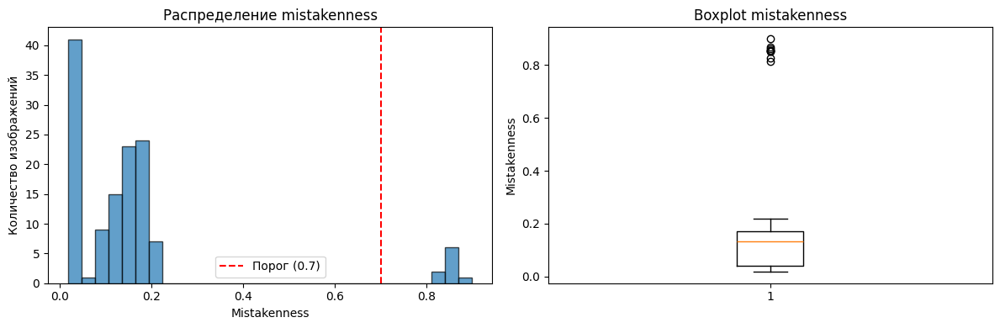


=== Корреляция с метриками ===

=== Экспорт для переразметки ===
Найдено 9 изображений для перепроверки:
  - frame_000002.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000004.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000006.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000007.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000009.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000011.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000012.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000014.png
    Подозрительные классы: ['Static Obstacle']
  - frame_000015.png
    Подозрительные классы: ['Static Obstacle']


In [108]:
# визуал
import matplotlib.pyplot as plt

# Собираем все значения mistakenness
mistakenness_values = []
for sample in dataset:
    if sample.mistakenness is not None:
        mistakenness_values.append(sample.mistakenness)

if mistakenness_values:
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.hist(mistakenness_values, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0.7, color='red', linestyle='--', label='Порог (0.7)')
    plt.xlabel('Mistakenness')
    plt.ylabel('Количество изображений')
    plt.title('Распределение mistakenness')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.boxplot(mistakenness_values, vert=True)
    plt.ylabel('Mistakenness')
    plt.title('Boxplot mistakenness')
    
    plt.tight_layout()
    plt.show()


print("\n=== Корреляция с метриками ===")

# Если у вас есть IoU метрики
if "miou" in dataset.get_field_schema():
    high_mist = dataset.match(F("mistakenness") > 0.7)
    low_mist = dataset.match(F("mistakenness") <= 0.7)
    
    print(f"Средний mIoU для высокой mistakenness: {high_mist.mean('miou'):.3f}")
    print(f"Средний mIoU для низкой mistakenness: {low_mist.mean('miou'):.3f}")

print("\n=== Экспорт для переразметки ===")

# Создаём список файлов, требующих внимания
files_to_review = []
for sample in suspicious_view:
    files_to_review.append({
        "filepath": sample.filepath,
        "mistakenness": sample.mistakenness,
        "suspicious_classes": [
            det.label for det in sample["gt_detections"].detections 
            if hasattr(det, 'mistakenness') and det.mistakenness is not None and det.mistakenness > 0.7
        ]
    })

print(f"Найдено {len(files_to_review)} изображений для перепроверки:")
for item in files_to_review:
    print(f"  - {item['filepath'].split('/')[-1]}")
    print(f"    Подозрительные классы: {item['suspicious_classes']}")

In [106]:
# статистика
import fiftyone as fo
from fiftyone import ViewField as F
from PIL import Image
import numpy as np

# ============================================================
# 1. Получаем читаемую информацию о топ-ошибках
# ============================================================
print("=== Топ-10 изображений с вероятными ошибками в разметке ===\n")
mistake_view = dataset.sort_by("mistakenness", reverse=True).limit(10)

for i, sample in enumerate(mistake_view, 1):
    # Человекочитаемая информация
    filepath = sample.filepath
    filename = filepath.split("/")[-1]
    tags = sample.tags
    
    print(f"{i}. {filename}")
    print(f"   Путь: {filepath}")
    print(f"   Видео: {tags}")
    print(f"   Mistakenness: {sample.mistakenness:.4f}")
    
    # Показываем подозрительные объекты в этом изображении
    gt_dets = sample["gt_detections"]
    if gt_dets and gt_dets.detections:
        print(f"   Объектов в разметке: {len(gt_dets.detections)}")
        for det in gt_dets.detections:
            if hasattr(det, 'mistakenness') and det.mistakenness is not None:
                print(f"     - {det.label}: mistakenness={det.mistakenness:.3f}")
    print()

# ============================================================
# 2. Детальный анализ подозрительных объектов
# ============================================================
print("\n=== Подозрительные объекты (mistakenness > 0.7) ===\n")

suspicious_view = dataset.filter_labels(
    "gt_detections",
    F("mistakenness") > 0.7
)

# Группируем по классам
from collections import Counter
class_counter = Counter()

for sample in suspicious_view:
    for det in sample["gt_detections"].detections:
        if hasattr(det, 'mistakenness') and det.mistakenness is not None and det.mistakenness > 0.7:
            class_counter[det.label] += 1
            print(f"Файл: {sample.filepath.split('/')[-1]}")
            print(f"  Класс: {det.label}")
            print(f"  Mistakenness: {det.mistakenness:.4f}")
            print(f"  BBox (нормализованный): {det.bounding_box}")
            print()

print("Распределение подозрительных объектов по классам:")
for cls, count in class_counter.most_common():
    print(f"  {cls}: {count}")

=== Топ-10 изображений с вероятными ошибками в разметке ===

1. frame_000014.png
   Путь: /workspace/data/relearn/vid3/images/frame_000014.png
   Видео: ['vid3']
   Mistakenness: 0.8987
   Объектов в разметке: 12
     - Static Obstacle: mistakenness=0.899
     - Static Obstacle: mistakenness=0.103
     - Static Obstacle: mistakenness=0.142
     - Static Obstacle: mistakenness=0.182
     - Water: mistakenness=0.001
     - Sky: mistakenness=0.002

2. frame_000015.png
   Путь: /workspace/data/relearn/vid3/images/frame_000015.png
   Видео: ['vid3']
   Mistakenness: 0.8686
   Объектов в разметке: 9
     - Static Obstacle: mistakenness=0.869
     - Static Obstacle: mistakenness=0.047
     - Water: mistakenness=0.002
     - Sky: mistakenness=0.002
     - Boat/ship: mistakenness=0.095
     - Boat/ship: mistakenness=0.120

3. frame_000009.png
   Путь: /workspace/data/relearn/vid3/images/frame_000009.png
   Видео: ['vid3']
   Mistakenness: 0.8597
   Объектов в разметке: 9
     - Static Obstacle:

In [9]:
!ls data/automarkup_results/success/
!ls data/automarkup_results/success/vid1
!ls data/automarkup_results/success/vid3/images
!ls data/automarkup_results/success/vid3/masks

vid1  vid2  vid3  vid4
images	masks
frame_000003.png  frame_000010.png  frame_000014.png
frame_000005.png  frame_000013.png
frame_000003.png	   frame_000010.png	      frame_000014.png
frame_000003_metrics.json  frame_000010_metrics.json  frame_000014_metrics.json
frame_000005.png	   frame_000013.png
frame_000005_metrics.json  frame_000013_metrics.json


In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Определение классов и цветов
CLASSES = {
    0: {'name': 'Static Obstacle', 'color': (128, 128, 128)},  # серый
    1: {'name': 'Water', 'color': (0, 0, 255)},               # красный
    2: {'name': 'Sky', 'color': (255, 0, 0)},                 # синий
    3: {'name': 'Boat/ship', 'color': (0, 255, 0)},           # зеленый
    4: {'name': 'Row boats', 'color': (255, 255, 0)},         # голубой
    5: {'name': 'Paddle board', 'color': (255, 0, 255)},      # пурпурный
    6: {'name': 'Buoy', 'color': (0, 255, 255)},              # желтый
    7: {'name': 'Swimmer', 'color': (255, 128, 0)},           # оранжевый
    8: {'name': 'Animal', 'color': (128, 0, 128)},            # фиолетовый
    9: {'name': 'Float', 'color': (255, 192, 203)},           # розовый
    10: {'name': 'Other', 'color': (0, 0, 0)}                 # черный
}

def load_mask(mask_path):
    """Загрузка маски из PNG файла"""
    mask = cv2.imread(str(mask_path), cv2.IMREAD_UNCHANGED)
    if mask is None:
        raise ValueError(f"Не удалось загрузить маску: {mask_path}")
    return mask

def create_colored_mask(mask):
    """
    Создание цветной маски на основе train_id
    """
    if len(mask.shape) == 3:
        # Если маска уже RGB, используем первый канал как train_id
        if mask.shape[2] >= 3:
            train_ids = mask[:, :, 0] if mask[:, :, 0].max() <= 10 else mask[:, :, 0] // 25
        else:
            train_ids = mask[:, :, 0]
    else:
        train_ids = mask
    
    # Создаем цветную маску
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    
    for train_id, class_info in CLASSES.items():
        colored_mask[train_ids == train_id] = class_info['color']
    
    return colored_mask

def overlay_mask(image, mask, alpha=0.5):
    """Наложение маски на изображение"""
    colored_mask = create_colored_mask(mask)
    overlay = cv2.addWeighted(image, 1 - alpha, colored_mask, alpha, 0)
    return overlay

def visualise_res(img_path, manual_mask_path=None):
    """
    Визуализация результатов: оригинал, маска, наложенная маска, ручная разметка
    
    Args:
        img_path: путь к изображению
        manual_mask_path: путь к ручной маске (опционально)
    """
    img_path = Path(img_path)
    
    # Определяем пути
    vid_dir = img_path.parent.parent if 'images' in str(img_path) else img_path.parent
    masks_dir = vid_dir / 'masks'
    mask_path = masks_dir / img_path.name
    
    # Загрузка изображения
    image = cv2.imread(str(img_path))
    if image is None:
        raise ValueError(f"Не удалось загрузить изображение: {img_path}")
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Загрузка автоматической маски
    auto_mask = load_mask(mask_path)
    auto_colored = create_colored_mask(auto_mask)
    auto_colored_rgb = cv2.cvtColor(auto_colored, cv2.COLOR_BGR2RGB)
    
    # Наложение автоматической маски
    auto_overlay = overlay_mask(image, auto_mask)
    auto_overlay_rgb = cv2.cvtColor(auto_overlay, cv2.COLOR_BGR2RGB)
    
    # Определяем количество колонок
    n_cols = 3 if manual_mask_path is None else 4
    
    # Создание визуализации
    fig, axes = plt.subplots(1, n_cols, figsize=(6*n_cols, 6))
    
    # Оригинальное изображение
    axes[0].imshow(image_rgb)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # Автоматическая маска
    axes[1].imshow(auto_colored_rgb)
    axes[1].set_title('Auto Mask')
    axes[1].axis('off')
    
    # Наложенная автоматическая маска
    axes[2].imshow(auto_overlay_rgb)
    axes[2].set_title('Auto Overlay')
    axes[2].axis('off')
    
    # Ручная разметка (если указана)
    if manual_mask_path:
        manual_mask_path = Path(manual_mask_path)
        manual_mask = load_mask(manual_mask_path)
        manual_colored = create_colored_mask(manual_mask)
        manual_colored_rgb = cv2.cvtColor(manual_colored, cv2.COLOR_BGR2RGB)
        
        axes[3].imshow(manual_colored_rgb)
        axes[3].set_title('Manual Mask')
        axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return fig

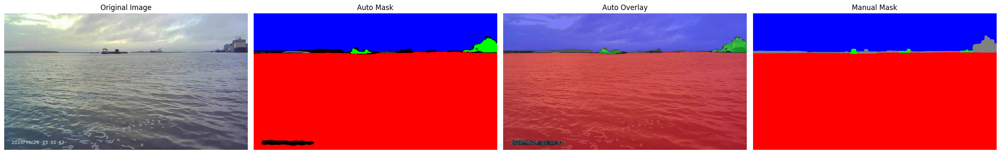

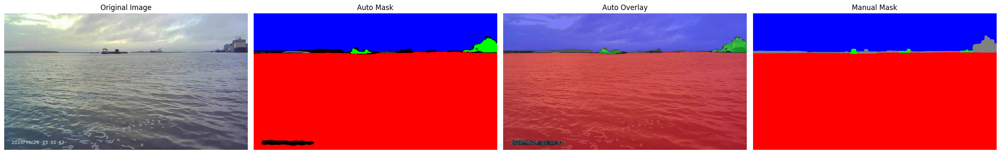

In [31]:
visualise_res(
    "data/automarkup_results/success/vid3/images/frame_000005.png", 
    "data/manual_markup/coco1_0_03/converted_masks/panoptic_masks/frame_000005.png"
    )